# Explore the CAZome of _Pectobacteriaceae_ genomes

This notebook explores the size and composition of 717 Genbank _Pectobacteriaceae_ CAZomes.

## GitHub

Information of the complete method for this analysis, including augmenting the dataset, a README-walkthrough, and the output figure files, can be found in the [GitHub repository](https://github.com/HobnobMancer/SI_Hobbs_et_al_2023_Pecto/).

## Table of Contents

0. [Imports](#imports)
    * Load packages
    * Load in data
1. [CAZome size](#cazome-size)
    * Compare the number of CAZymes
    * Compare the proportion of the proteome represented by the CAZomes
2. [CAZy classes](#cazy-classes)
    * The number of CAZymes per CAZy class
    * Mean (+/- SD) number of CAZymes per CAZy class per genus
3. [CAZy families](#cazy-families)
    * Calculate CAZy family frequencies per genome
    * Plot a clustermap of CAZy family frequencies
4. [Core CAZome](#core-cazome)
    * Identify families that are present in all genomes
    * Calculate the frequency of families in the core CAZome
    * [_Pectobacterium_](#pecto-core-cazome) core CAZome
    * [_Dickeya_](#dic-core-cazome)
5. [Always co-occurring families](#co-occurring)
    * Identify CAZy families that are always present in the genome together
    * Explore across all _Pectobacterium_ and _Dickeya_ genomes, and per genus
    * Build an upset plot of co-occurring CAZy families
    * Compile a matrix with the indcidence data for each group of co-occurring CAZy families
6. [Principal Component Analysis (PCA)](#pca)
    * Explore the association between the host range, global distribution and composition of the CAZome
    * Explore across all _Pectobacterium_ and _Dickeya_ genomes, and per genus

<a id="imports"></a>
# 0. Imports

## Packages

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import statistics
import re
import time

from copy import copy
from matplotlib.patches import Patch
from pathlib import Path

import adjustText
import upsetplot

from Bio import SeqIO
from saintBioutils.utilities.file_io.get_paths import get_file_paths
from saintBioutils.utilities.file_io import make_output_directory
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tqdm.notebook import tqdm

%matplotlib inline

In [2]:
# loading and parsing data
from cazomevolve.cazome.explore.parse_data import (
    load_fgp_data,
    load_tax_data,
    add_tax_data_from_tax_df,
    add_tax_column_from_row_index,
)

# functions for exploring the sizes of CAZomes
from cazomevolve.cazome.explore.cazome_sizes import (
    calc_proteome_representation,
    count_items_in_cazome,
    get_proteome_sizes,
    count_cazyme_fam_ratio,
)

# explore the frequency of CAZymes per CAZy class
from cazomevolve.cazome.explore.cazy_classes import calculate_class_sizes

# explore the frequencies of CAZy families and identify the co-cazome
from cazomevolve.cazome.explore.cazy_families import (
    build_fam_freq_df,
    build_row_colours,
    build_family_clustermap,
    identify_core_cazome,
    plot_fam_boxplot,
    build_fam_mean_freq_df,
    get_group_specific_fams,
    build_family_clustermap_multi_legend,
)

# functions to identify and explore CAZy families that are always present together
from cazomevolve.cazome.explore.cooccurring_families import (
    identify_cooccurring_fams_corrM,
    calc_cooccuring_fam_freqs,
    identify_cooccurring_fam_pairs,
    add_to_upsetplot_membership,
    build_upsetplot,
    get_upsetplot_grps,
    add_upsetplot_grp_freqs,
    build_upsetplot_matrix,
)

# functions to perform PCA
from cazomevolve.cazome.explore.pca import (
    perform_pca,
    plot_explained_variance,
    plot_scree,
    plot_pca,
    plot_loadings,
)

## Output directory

To make the parent output directory, and further down to make output subdirectories, use the function `make_output_directory` from the `saintBioutils` package.

One positional argument is required: the path to the target output directory to be build - _this must be a `Path` object._

<div class="alert alert-danger">
The path for the output directory must be provided as a **Path** object from the `pathlib` package.
</div>

<div class="alert alert-warning">
    Setting <b>force</b> and <b>nodelete</b> to True will ensure the output directory is created, and if it exists, content in the output directory is not deleted.
</div>





In [3]:
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results'), force=True, nodelete=True)

Built output directory: ../results


## Import Data 

### CAZy family annotations

To import CAZy family annotations, load the tab delimited file listing cazy families, genomes and protein accessions, by providing the path to the 'gfp file' to `load_gfp_data()` function from `cazomevolve`.

<div class="alert alert-info">
    <b>Note:</b> Each unique protein-family pair is represented on a separate line. A protein can contain multiple CAZyme domains and thus can be annotated with multiple CAZy families. Therefore, a single protein can be present on multiple rows in the dataframe called <b>gfp_df</b>.
</div>

In [4]:
fgp_file = "../data/cazomes/pecto_fam_genomes_proteins"
fgp_df = load_fgp_data(fgp_file)
fgp_df.head(3)

,Family,Genome,Protein
0,CBM50,GCA_003382565.3,UEM40323.1
1,GT35,GCA_003382565.3,UEM39157.1
2,GH5,GCA_003382565.3,UEM41238.1


In [5]:
print(f"Total CAZymes (i.e. the number of unique protein IDs): {len(set(fgp_df['Protein']))}")

Total CAZymes (i.e. the number of unique protein IDs): 78132


### Taxonomy data

Load in CSV containing taxonomic information, that was generated using the `cazomevolve` subcommand `add_taxs`, by providing a path to the file to `load_tax_data()` function from `cazomevovle`, and specify which taxonomic ranks (kingdom, phylum, etc.) are listed in the CSV file.

In this case, genus and species inforamtion was retrieved from the NCBI database and are stored in the CSV file.

<div class="alert alert-info">
    <b>Note:</b> The CSV file created using the cazomevolve subcommand "add_taxs" will contain a column called 'Genome', listing genomic accessions, and one column per taxonomic rank retrieved from NCBI and/or GTDB.
</div>

In [6]:
tax_csv_path = "../data/cazomes/fg_genome_taxs.csv"
tax_df = load_tax_data(tax_csv_path, genus=True, species=True)
tax_df.head(3)

,Genome,Genus,Species
0,GCA_922021645.1,Pectobacterium,versatile
1,GCA_004296685.1,Pectobacterium,versatile
2,GCA_018094705.1,Pectobacterium,versatile


### Compile all data into a single dataframe

Build dataframe of:
* CAZy family annotations
* Genomic accession
* Taxonomic information - splitting each taxonomy rank (i.e. ranks) into a separate column. E.g.:
    * Genus
    * Species

In [7]:
fgp_df = add_tax_data_from_tax_df(
    fgp_df,
    tax_df,
    genus=True,
    species=True,
)
fgp_df.head(3)

,Family,Genome,Protein,Genus,Species
0,CBM50,GCA_003382565.3,UEM40323.1,Pectobacterium,aquaticum
1,GT35,GCA_003382565.3,UEM39157.1,Pectobacterium,aquaticum
2,GH5,GCA_003382565.3,UEM41238.1,Pectobacterium,aquaticum


In [8]:
print(f"Total CAZymes: {len(set(fgp_df['Protein']))}")

Total CAZymes: 78132


<a id="cazome-size"> </a>
# 1. CAZome size

Explore and compare the sizes of the CAZomes, by calculating:

* The number of CAZymes per genome
* The mean number of CAZymes per genome per genus
* The proportion of the proteome represented by the CAZome
* The mean proportion of the proteome represented by the CAZome

<div class="alert alert-info">
    <b>Note:</b> The number of CAZymes is defined as the unique number of protein IDs.
</div>

Use the `count_items_in_cazome()` function to retrieve the number of CAZymes and the number of CAZy families per genome, and the mean (and standard deviation (SD)) counts per genus.

In [9]:
# check all genomes are represented in the fgp_df
f"Examining {len(set(fgp_df['Genome']))} genomes"

'Examining 717 genomes'

In [10]:
print(f"Examining {len(set(fgp_df['Genus']))} genera:")
for genus in set(fgp_df['Genus']):
    print(f'- {genus}')

Examining 8 genera:
- Dickeya
- Pectobacterium
- Brenneria
- Affinibrenneria
- Samsonia
- Lonsdalea
- Acerihabitans
- Musicola


### Count the number of CAZymes

In [11]:
# Calculate CAZymes per genome
cazome_sizes_dict, cazome_sizes_df = count_items_in_cazome(fgp_df, 'Protein', 'Genus', round_by=2)
cazome_sizes_df

Gathering CAZy families per genome: 100%|██████████| 83143/83143 [00:10<00:00, 8297.22it/s]
Calculating num of Protein per genome and per Genus: 100%|██████████| 8/8 [00:00<00:00, 2959.73it/s]


,Genus,MeanProteins,SdProteins,NumOfGenomes
0,Pectobacterium,112.65,8.02,432
1,Dickeya,111.16,6.60,206
2,Musicola,92.25,2.28,4
3,Brenneria,87.79,7.46,33
4,Lonsdalea,77.15,4.70,39
5,Acerihabitans,106.00,0.00,1
6,Affinibrenneria,108.00,0.00,1
7,Samsonia,81.00,0.00,1


In [12]:
# calculate mean across pectobacteriaceae
pectobact_cazome_sizes = []
for genus in cazome_sizes_dict:
    for genome in cazome_sizes_dict[genus]:
        pectobact_cazome_sizes.append(cazome_sizes_dict[genus][genome]['numOfProteins'])

pd.concat(
    [
        cazome_sizes_df, 
        pd.DataFrame(
            [[
                'Pectobacteriaceae',
                np.mean(pectobact_cazome_sizes),
                np.std(pectobact_cazome_sizes),
                len(set(fgp_df['Genome'])),
            ]], 
            columns=cazome_sizes_df.columns
        ),
    ],
    axis=0,
)

,Genus,MeanProteins,SdProteins,NumOfGenomes
0,Pectobacterium,112.650000,8.020000,432
1,Dickeya,111.160000,6.600000,206
2,Musicola,92.250000,2.280000,4
3,Brenneria,87.790000,7.460000,33
4,Lonsdalea,77.150000,4.700000,39
5,Acerihabitans,106.000000,0.000000,1
6,Affinibrenneria,108.000000,0.000000,1
7,Samsonia,81.000000,0.000000,1
0,Pectobacteriaceae,108.970711,11.958225,717


#### Identify the total number of CAZymes

In [13]:
print(f"The total number of CAZymes is {len(set(fgp_df['Protein']))}")

for genus in set(fgp_df['Genus']):
    genus_df = fgp_df[fgp_df['Genus'] == genus]
    print(f"The total number of {genus} CAZymes is {len(set(genus_df['Protein']))}")

The total number of CAZymes is 78132
The total number of Dickeya CAZymes is 22899
The total number of Pectobacterium CAZymes is 48663
The total number of Brenneria CAZymes is 2897
The total number of Affinibrenneria CAZymes is 108
The total number of Samsonia CAZymes is 81
The total number of Lonsdalea CAZymes is 3009
The total number of Acerihabitans CAZymes is 106
The total number of Musicola CAZymes is 369


### Count the number of CAZy families

In [14]:
# Calculate CAZy families per genome
cazome_fam_dict, cazome_fams_df = count_items_in_cazome(fgp_df, 'Family', 'Genus', round_by=2)
cazome_fams_df

Gathering CAZy families per genome: 100%|██████████| 83143/83143 [00:10<00:00, 8279.61it/s]
Calculating num of Family per genome and per Genus: 100%|██████████| 8/8 [00:00<00:00, 3237.28it/s]


,Genus,MeanFamilys,SdFamilys,NumOfGenomes
0,Pectobacterium,62.08,3.46,432
1,Dickeya,59.05,3.04,206
2,Musicola,50.25,0.43,4
3,Brenneria,53.67,3.71,33
4,Lonsdalea,42.62,2.14,39
5,Acerihabitans,48.00,0.00,1
6,Affinibrenneria,48.00,0.00,1
7,Samsonia,49.00,0.00,1


In [15]:
# calculate mean across pectobacteriaceae
pectobact_fam_nums = []
for genus in cazome_fam_dict:
    for genome in cazome_fam_dict[genus]:
        pectobact_fam_nums.append(cazome_fam_dict[genus][genome]['numOfFamilys'])

pd.concat(
    [
        cazome_fams_df, 
        pd.DataFrame(
            [[
                'Pectobacteriaceae',
                np.mean(pectobact_fam_nums),
                np.std(pectobact_fam_nums),
                len(set(fgp_df['Genome'])),
            ]], 
            columns=cazome_fams_df.columns
        ),
    ],
    axis=0,
)

,Genus,MeanFamilys,SdFamilys,NumOfGenomes
0,Pectobacterium,62.080000,3.460000,432
1,Dickeya,59.050000,3.040000,206
2,Musicola,50.250000,0.430000,4
3,Brenneria,53.670000,3.710000,33
4,Lonsdalea,42.620000,2.140000,39
5,Acerihabitans,48.000000,0.000000,1
6,Affinibrenneria,48.000000,0.000000,1
7,Samsonia,49.000000,0.000000,1
0,Pectobacteriaceae,59.638773,5.733681,717


### Calculate ratio of CAZymes to CAZy families

The CAZyme to CAZy families ratio can be used to determine whether a genus typically contains few or many CAZymes per CAZy family.

In [16]:
cazome_ratio_dict, cazome_ratio_df = count_cazyme_fam_ratio(fgp_df, 'Genus', round_by=2)
cazome_ratio_df

Calculating CAZyme/CAZy family ratio: 100%|██████████| 8/8 [00:00<00:00, 3315.33it/s]


,Genus,MeanCAZymeToFamRatio,SdCAZymeToFamRatio,NumOfGenomes
0,Pectobacterium,1.81,0.09,432
1,Dickeya,1.88,0.07,206
2,Musicola,1.84,0.04,4
3,Brenneria,1.64,0.07,33
4,Lonsdalea,1.81,0.07,39
5,Acerihabitans,2.21,0.00,1
6,Affinibrenneria,2.25,0.00,1
7,Samsonia,1.65,0.00,1


In [17]:
pecto_ratios = []
for genus in cazome_sizes_dict:
    for genome in cazome_sizes_dict[genus]:
        ratio = (
            cazome_sizes_dict[genus][genome]['numOfProteins'] / cazome_fam_dict[genus][genome]['numOfFamilys']
        )
        pecto_ratios.append(ratio)

pd.concat(
    [
        cazome_ratio_df,
        pd.DataFrame(
            [[
                'Pectobacteriaceae',
                np.mean(pecto_ratios),
                np.std(pecto_ratios),
                len(set(fgp_df['Genome'])),
            ]],
            columns=cazome_ratio_df.columns
        )
    ],
    axis=0,
)

,Genus,MeanCAZymeToFamRatio,SdCAZymeToFamRatio,NumOfGenomes
0,Pectobacterium,1.810000,0.09000,432
1,Dickeya,1.880000,0.07000,206
2,Musicola,1.840000,0.04000,4
3,Brenneria,1.640000,0.07000,33
4,Lonsdalea,1.810000,0.07000,39
5,Acerihabitans,2.210000,0.00000,1
6,Affinibrenneria,2.250000,0.00000,1
7,Samsonia,1.650000,0.00000,1
0,Pectobacteriaceae,1.826642,0.09796,717


### Calculate proteome sizes

Calculate the number of unique protein IDs, total, in each genome - i.e. not just CAZymes but all proteins.

In [18]:
# Get the size of the proteome (the number of protein acc) per genome
grp = 'Genus'
proteome_dir = "../data/proteomes"
proteome_dict = get_proteome_sizes(proteome_dir, fgp_df, grp)

Getting proteome sizes: 0it [00:00, ?it/s]


In [19]:
# get total number of proteins across all proteomes
total_proteins = 0
for genus in proteome_dict:
    for genome in proteome_dict[genus]:
        total_proteins += proteome_dict[genus][genome]['numOfProteins']
print(f"Total number of proteins across all genomes: {total_proteins}")

Total number of proteins across all genomes: 0


### Calculate the percentage of the proteome represented by the CAZome

Calculate the percentage of the proteome that is made up of the CAZome.

In [20]:
# Calculate the mean proteome size by genus and the proportion of the proteome represented by the CAZome
proteome_perc_df = calc_proteome_representation(proteome_dict, cazome_sizes_dict, grp, round_by=2)
proteome_perc_df

Getting proteome size: 100%|██████████| 8/8 [00:00<00:00, 57.97it/s]


Not proteome size available for GCA_003382565.3.
Skipping this genome
Not proteome size available for GCA_013488025.1.
Skipping this genome
Not proteome size available for GCA_024722495.1.
Skipping this genome
Not proteome size available for GCA_024498855.1.
Skipping this genome
Not proteome size available for GCA_012427845.1.
Skipping this genome
Not proteome size available for GCA_016944275.1.
Skipping this genome
Not proteome size available for GCA_002307355.1.
Skipping this genome
Not proteome size available for GCA_016944235.1.
Skipping this genome
Not proteome size available for GCA_016864995.1.
Skipping this genome
Not proteome size available for GCA_016944255.1.
Skipping this genome
Not proteome size available for GCA_001742185.1.
Skipping this genome
Not proteome size available for GCA_002288545.1.
Skipping this genome
Not proteome size available for GCA_021049225.1.
Skipping this genome
Not proteome size available for GCA_002764035.1.
Skipping this genome
Not proteome size av

Calc proteome perc: 0it [00:00, ?it/s]


,Genus,MeanProteomeSize,SdProteomeSize,MeanProteomePerc,SdProteomePerc,NumOfGenomes


In [21]:
pectobact_average = ['Pectobacteriaceae']
for col in proteome_perc_df.columns[1:]:
    pectobact_average.append(np.mean(list(proteome_perc_df[col])))
pectobact_average[-1] == 660

df = pd.DataFrame([pectobact_average], columns=proteome_perc_df.columns)
pd.concat([proteome_perc_df, df], ignore_index=True, axis=0).round(2)

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Genus,MeanProteomeSize,SdProteomeSize,MeanProteomePerc,SdProteomePerc,NumOfGenomes
0,Pectobacteriaceae,NaN,NaN,NaN,NaN,NaN


### Combine into a single dataframe

For easier comparison and presentation, combine the dataframes made above into a single dataframe, with each row representing a different genus.

In [22]:
all_df = pd.concat([proteome_perc_df, cazome_sizes_df, cazome_fams_df, cazome_ratio_df], axis=1, join='inner')
make_output_directory(Path('../results/cazome_size'), force=True, nodelete=True)
all_df.to_csv('../results/cazome_size/cazome_sizes.csv')
all_df

Built output directory: ../results/cazome_size


,Genus,MeanProteomeSize,SdProteomeSize,MeanProteomePerc,SdProteomePerc,NumOfGenomes,Genus,MeanProteins,SdProteins,NumOfGenomes,Genus,MeanFamilys,SdFamilys,NumOfGenomes,Genus,MeanCAZymeToFamRatio,SdCAZymeToFamRatio,NumOfGenomes


In [23]:
# calculate means for Pectobacteriaceae
for col in all_df:
    if col == 'Genus' or col == 'NumOfGenomes':
        continue
    print(col, '--', np.mean(list(all_df[col])).round(2))

MeanProteomeSize -- nan
SdProteomeSize -- nan
MeanProteomePerc -- nan
SdProteomePerc -- nan
MeanProteins -- nan
SdProteins -- nan
MeanFamilys -- nan
SdFamilys -- nan
MeanCAZymeToFamRatio -- nan
SdCAZymeToFamRatio -- nan


/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


<a id="cazy-classes"> </a>
# 2. CAZy classes

Calculate the number of CAZymes (identified as the number of unique protein accessions) per CAZy class. Also, calculate the mean size of CAZy classes (i.e. the mean number of unique protein accessions per CAZy class in each genome) per genus.

The results are added to a dataframe, which is written to `results/pecto_dic/cazy_class_sizes.csv`, and was used to generate a proportiona area plot using [RawGraphs](https://app.rawgraphs.io/).

In [24]:
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/cazy_classes/'), force=True, nodelete=True)

Built output directory: ../results/cazy_classes


In [25]:
class_df, class_size_dict = calculate_class_sizes(fgp_df, 'Genus', round_by=2)

Calculating CAZy class sizes: 100%|██████████| 6/6 [00:00<00:00, 134.29it/s]


In [26]:
# add values with means across all genera to represent pectobacteriaceae
pectobact_class_means = []

for cazy_class in set(class_df['CAZyClass']):
    df = class_df[class_df['CAZyClass'] == cazy_class]
    new_row = [cazy_class, 'Pectobacteriaceae']
    
    for col in class_df.columns[2:]:
        mean = np.mean(df[col])
        new_row.append(mean)
    
    new_row[-1] = 660
    
    pectobact_class_means.append(new_row)

df = pd.DataFrame(pectobact_class_means, columns = class_df.columns)
all_class_df = pd.concat([class_df, df], axis=0, ignore_index=True)
all_class_df = all_class_df.round(2)
# replace nan with 0
all_class_df = all_class_df.fillna(0)

filtered_class_df = all_class_df[all_class_df['Genus'] != 'Haf']
all_class_df.to_csv('../results/cazy_classes/cazy_class_sizes.csv')

all_class_df

,CAZyClass,Genus,MeanCazyClass,SdCazyClass,MeanClassPerc,SdClassPerc,NumOfGenomes
0,GH,Dickeya,42.53,3.55,38.24,1.85,206
1,GH,Pectobacterium,50.11,3.91,44.50,1.87,432
2,GH,Brenneria,42.48,6.60,48.14,4.19,33
3,GH,Affinibrenneria,59.00,0.00,54.63,0.00,1
4,GH,Samsonia,34.00,0.00,41.98,0.00,1
5,GH,Lonsdalea,30.85,2.28,39.96,1.31,39
6,GH,Acerihabitans,51.00,0.00,48.11,0.00,1
7,GH,Musicola,37.00,0.00,40.13,0.99,4
8,GT,Dickeya,37.21,3.12,33.52,2.62,206
9,GT,Pectobacterium,31.76,3.86,28.15,2.23,432


## Explore AA CAZymes in _Pectobacteriaceae_

Very few genomes contained any AA CAZymes.

Identify the number of genomes were no AA CAZymes were found, additionally, find the maximum, minimum and mode number of AA CAZymes found across all 660 genomes.

In [27]:
# calc genomes with no AAs
no_aa_genomes = 0
for genus in class_size_dict['AA']:
    for genome in class_size_dict['AA'][genus]:
        no_aa_genomes+=1
print(f"{no_aa_genomes} genomes have no AAs")

aa_counts = [0] * no_aa_genomes
for genus in class_size_dict['AA']:
    for genome in class_size_dict['AA'][genus]:
        aa_counts.append(len(class_size_dict['AA'][genus][genome]['proteins']))
print(f"Max: {max(aa_counts)}\nMin: {min(aa_counts)}\nMode: {statistics.mode(aa_counts)}")

465 genomes have no AAs
Max: 2
Min: 0
Mode: 0


Count the number of genomes were 1 or 2 AA CAZymes were found.

In [28]:
# find genomes with 2 AAs
two_aa_genomes = {}
one_aa_genomes = {}

for genus in class_size_dict['AA']:
    for genome in class_size_dict['AA'][genus]:
        if len(class_size_dict['AA'][genus][genome]['proteins']) == 2:
            try:
                two_aa_genomes[genus].add(genome)
            except KeyError:
                two_aa_genomes[genus] = {genome}
                
        elif len(class_size_dict['AA'][genus][genome]['proteins']) == 1:
            try:
                one_aa_genomes[genus].add(genome)
            except KeyError:
                one_aa_genomes[genus] = {genome}

two_aa_genomes

{'Pectobacterium': {'GCA_000738125.1',
  'GCA_000749915.1',
  'GCA_011378985.1',
  'GCA_011379045.1',
  'GCA_020971565.1',
  'GCA_024343355.1',
  'GCA_024722495.1',
  'GCA_028335745.1',
  'GCA_900195285.2',
  'GCA_900195295.2'}}

In [29]:
for genus in one_aa_genomes:
    print(f"{genus}: {len(one_aa_genomes[genus])}")

Pectobacterium: 361
Dickeya: 85
Brenneria: 8
Samsonia: 1


<a id="cazy-families"> </a>
# 3. CAZy families

## CAZy family frequency dataframe

Calculate the number of CAZymes per CAZy family presented in each genome, where the number of CAZymes is the number of unqiue protein accessions. This value may be greater than the number of CAZymes in the genome because a CAZyme may be annotated with multiple CAZy families.

In [30]:
# make output directory
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/cazy_families/'), force=True, nodelete=True)

Built output directory: ../results/cazy_families


In [31]:
fam_freq_df = build_fam_freq_df(fgp_df, ['Genus', 'Species'])
fam_freq_df

The dataset contains 117 CAZy families


Counting fam frequencies: 100%|██████████| 717/717 [01:04<00:00, 11.10it/s]


,Genome,Genus,Species,AA10,AA3,CBM0,CBM13,CBM18,CBM3,CBM32,...,PL11,PL17,PL2,PL22,PL26,PL3,PL35,PL38,PL4,PL9
0,GCA_005484945.1,Brenneria,rubrifaciens,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
1,GCA_003121725.1,Pectobacterium,atrosepticum,0,1,0,1,0,1,1,...,0,0,2,1,1,2,0,0,1,2
2,GCA_020406855.1,Pectobacterium,carotovorum,0,1,0,1,0,1,1,...,1,0,2,1,1,2,0,0,1,2
3,GCA_003121785.1,Pectobacterium,parmentieri,0,0,0,1,0,1,1,...,0,0,2,1,1,1,0,0,1,2
4,GCA_022748065.1,Dickeya,dianthicola,0,0,0,0,0,0,1,...,0,0,1,1,1,2,0,0,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
712,GCA_018628895.1,Dickeya,dianthicola,0,0,0,0,0,0,1,...,0,0,1,1,1,2,0,1,2,3
713,GCA_019426305.1,Pectobacterium,polaris,0,1,0,1,0,1,2,...,1,0,2,1,1,2,0,0,1,2
714,GCA_922037565.1,Pectobacterium,polaris,0,1,0,1,0,1,2,...,1,0,2,1,1,1,0,0,1,2
715,GCA_003595065.1,Pectobacterium,versatile,0,1,0,1,0,1,1,...,0,0,2,1,1,2,0,0,1,2


In [32]:
fam_freq_df.to_csv("../results/cazy_families/cazy_fam_freqs.csv")

## Clustermaps

Build clustermap of CAZy family frequencies, with additional row colours marking the genus classification of each genome (i.e. each row).

### Prepare the dataframe of CAZy family frequencies

Index `fam_freq_df` so that each row name contains the genome, Genus and Species, so that the genomic accession, genus and species is included in the clustermap.

In [33]:
# index the taxonomy data and genome (ggs=genome_genus_species)
fam_freq_df_ggs = copy(fam_freq_df)  # so does not alter fam_freq_df
fam_freq_df_ggs = fam_freq_df_ggs.set_index(['Genome','Genus','Species'])
fam_freq_df_ggs.head(1)

,,,AA10,AA3,CBM0,CBM13,CBM18,CBM3,CBM32,CBM4,CBM48,CBM5,...,PL11,PL17,PL2,PL22,PL26,PL3,PL35,PL38,PL4,PL9
Genome,Genus,Species,,,,,,,,,,,,,,,,,,,,,
GCA_005484945.1,Brenneria,rubrifaciens,0,1,0,0,0,1,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0


### Colour scheme

Define a colour scheme to colour code the rows by, in this case by the genus of the species.

To do this, add a column containing the data to be used to colour code each row, e.g. a genus. This extra column is removed by `build_row_colours()`.

<div class="alert alert-warning">
    <b>Note:</b> The dataframe that is parsed to <b>build_row_colours()<\b> must be the dataframe that is used to generate a clustermap, otherwise Seaborn will not be able to map the row oclours correctly and no row colours will be produced.
</div>

In [34]:
# define a colour scheme to colour code rows by genus
fam_freq_df_ggs['Genus'] = list(fam_freq_df['Genus'])  # add column to use for colour scheme, is removed
fam_freq_genus_row_colours, fam_g_lut = build_row_colours(fam_freq_df_ggs, 'Genus', 'Set2')

### Build a clustermap of CAZy family frequencies

Use the function `build_family_clustermap()` from `cazomevolve` to build clustermaps of the CAZy family frequencies, with different combinations of additional row colours. For example, the row colours could list the genus and/or species classification of each genome.


A large version of a cluster map of CAZy family frequencies with each row representing a unique 
genome (and colour coded by the genus classification of the genome), and each column representing 
a unique CAZy family.

This full sized figure is generated for human readability. However, this figure is extremely large, and 
potentially too large for publication. Therefore, a smaller figure is generated below.



/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


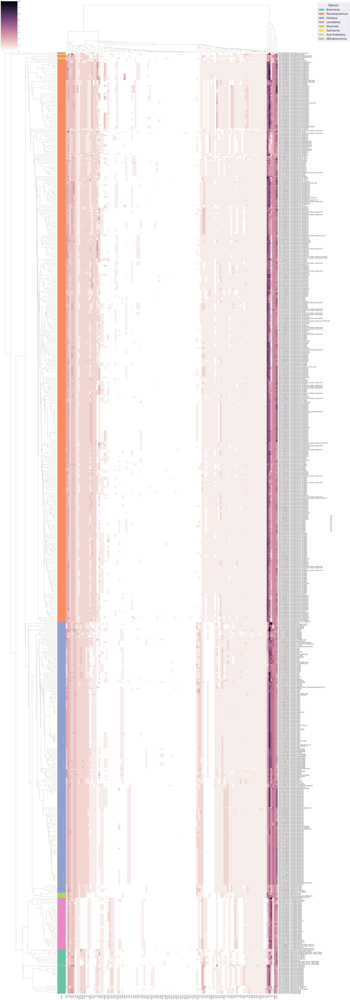

In [35]:
# make a figure that is full size, and all data is legible
print("""
A large version of a cluster map of CAZy family frequencies with each row representing a unique 
genome (and colour coded by the genus classification of the genome), and each column representing 
a unique CAZy family.

This full sized figure is generated for human readability. However, this figure is extremely large, and 
potentially too large for publication. Therefore, a smaller figure is generated below.
""")
large_fam_clustermap = build_family_clustermap(
    fam_freq_df_ggs,
    row_colours=fam_freq_genus_row_colours,
    fig_size=(40,120),
    file_path="../results/cazy_families/fam_freq_clustermap.svg",
    file_format='svg',
    lut=fam_g_lut,
    legend_title='Genus',
    dendrogram_ratio=(0.2,0.05),
    title_fontsize=28,
    legend_fontsize=24,
    cbar_pos=(0, 0.95, 0.05, 0.05),
)

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


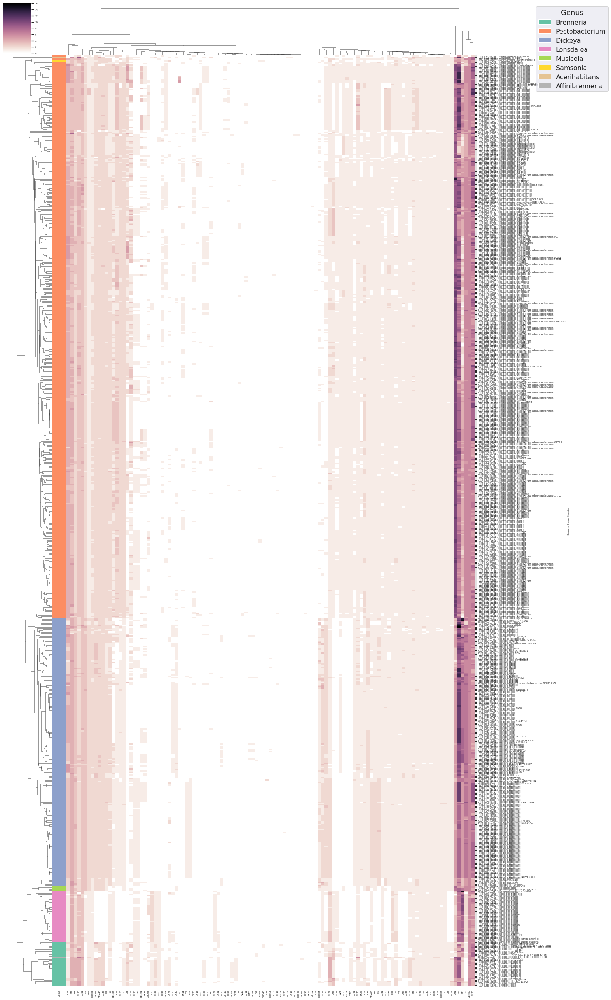

In [36]:
# make a figure the optimal size to fit in a paper
build_family_clustermap(
    fam_freq_df_ggs,
    row_colours=fam_freq_genus_row_colours,
    fig_size=(20,35),
    file_path="../results/cazy_families/paper_fam_freq_clustermap.png",
    file_format='png',
    font_scale=0.5,
    lut=fam_g_lut,
    legend_title='Genus',
    dendrogram_ratio=(0.1,0.05),
    title_fontsize=18,
    legend_fontsize=16,
    cbar_pos=(0, 0.95, 0.05, 0.05),
)

## Add species classifications

Looking at the species names in the clustermap, there appears to be clustering of the genomes in a manner that correlates not only with their genus classificaiton but also their species classification. Therefore, add an additional row of row-colours, marking the species classification of each genome.

In [37]:
# define a colour scheme to colour code rows by SPECIES
fam_freq_df_ggs['Species'] = list(fam_freq_df['Species'])  # add column to use for colour scheme, is removed
fam_freq_species_row_colours, fam_s_lut = build_row_colours(fam_freq_df_ggs, 'Species', 'rainbow')

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


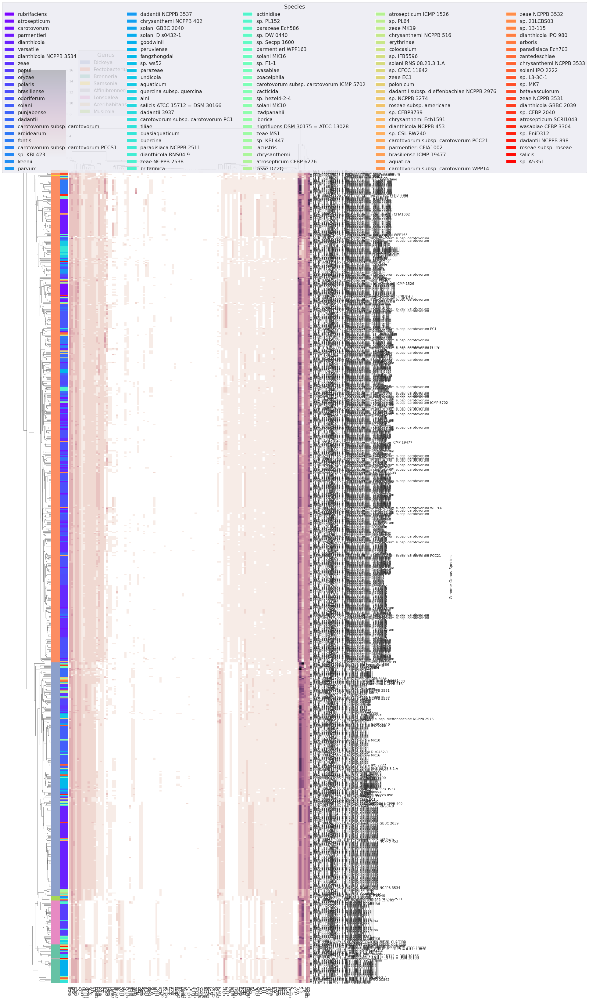

In [38]:
# make a figure the optimal size to fit in a paper
build_family_clustermap_multi_legend(
    df=fam_freq_df_ggs,
    row_colours=[fam_freq_genus_row_colours,fam_freq_species_row_colours],
    luts=[fam_g_lut, fam_s_lut],
    legend_titles=['Genus', 'Species'],
    bbox_to_anchors=[(0.2,1.045), (0.63,1.04)],
    legend_cols=[1,5],
    fig_size=(20,40),
    file_path="../results/cazy_families/paper_genus_species_fam_freq_clustermap.png",
    file_format='png',
    font_scale=1,
    dendrogram_ratio=(0.1,0.05),
    title_fontsize=18,
    legend_fontsize=16,
    cbar_pos=(0.01, 0.96, 0.1, 0.1),  #left, bottom, width, height
)

## Add phenotype classification to clustermap

The clustering of the genomes into their respective genera appears to also correlate with the soft versus hard plant tissue targeting phenotypes. Therefore, add an additional row colour that colour codes each row by the genomes preference for soft or hard plant tissues.

In [39]:
# define a colour scheme to colour code SOFT vs HARD plant tissue targeting genomes
phenotype_col = []
for ri in range(len(fam_freq_df_ggs)):
    if list(fam_freq_df['Genus'])[ri] in ['Pectobacterium', 'Dickeya', 'Musicola']:
        phenotype_col.append('Soft tissue targeting')
    else:
        phenotype_col.append('Hard tissue targeting')
fam_freq_df_ggs['Phenotype'] = phenotype_col
fam_freq_pheno_row_colours, fam_p_lut = build_row_colours(fam_freq_df_ggs, 'Phenotype', "Set1")

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


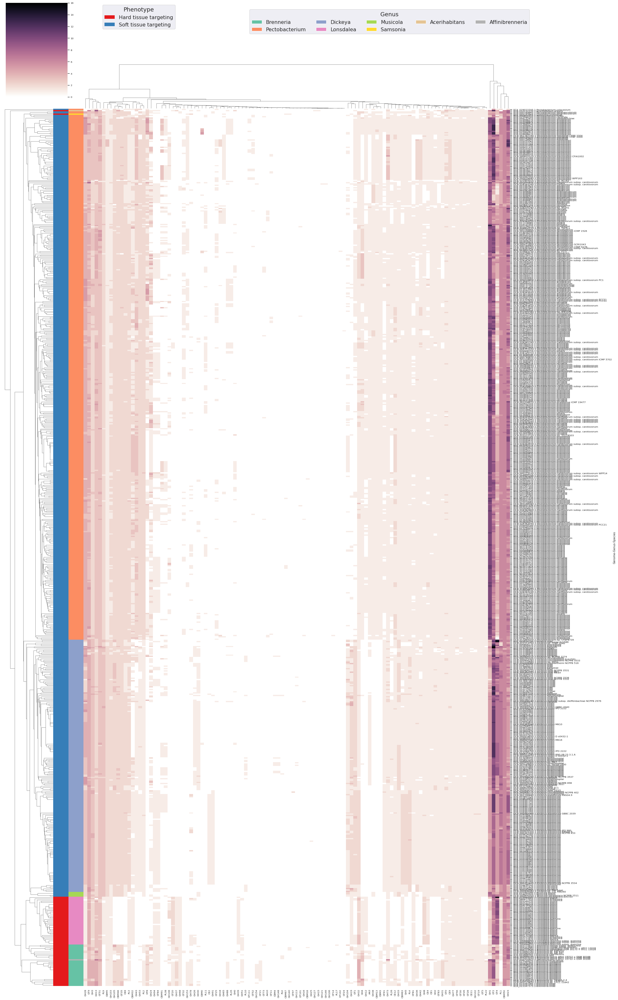

In [40]:
build_family_clustermap_multi_legend(
    df=fam_freq_df_ggs,
    row_colours=[fam_freq_pheno_row_colours, fam_freq_genus_row_colours],
    luts=[fam_p_lut, fam_g_lut],
    legend_titles=['Phenotype', 'Genus'],
    bbox_to_anchors=[(0.225,1.045), (0.63,1.04)],
    legend_cols=[1,5],
    fig_size=(27,41),
    file_path="../results/cazy_families/paper_pheno_genus_fam_freq_clustermap.png",
    file_format='png',
    font_scale=0.7,
    dendrogram_ratio=(0.1,0.05),
    title_fontsize=18,
    legend_fontsize=16,
    cbar_pos=(0.01, 0.96, 0.1, 0.1),  #left, bottom, width, height
)

## Remove genomes

In the clustermaps the genomes GCA_029023745.1 (_Pectobacterium colocasium_), GCA_000749925.1 and GCA_000749945.1 (_Pectobacterium betavasulorum_) contained under estimated representations of their respective CAZomes.

Six _Pectobacterium_ genomes were not included within the main _Pectobacterium_ subtree (dendrogram on the RHS of clustermap):
* GCA\_000749925.1 and GCA\_000749845.1 (_Pectobacterium betavasulorum_)
* GCA\_000803215.1 (_Pectobacterium fontis_)
* GCA\_025946765.1 (_Pectobacterium cacticida_)
* GCA\_004137815.1 (_Pectobacterium zantedeschiae_)
* GCA\_029023745.1 (_Pectobacterium colocasium_)

**Extracted from the paper:**
> The genomes appeared to contain fewer total CAZymes (inferred from the lower CAZy family frequencies) than other _Pectobacterium_ genomes, inferring a potential underestimation of their CAZyme features. Genomes GCA_000749925.1, GCA_000749845.1, and GCA_000803215.1 were were listed with the assembly status 'contig' in NCBI (June 2021). Genomic assemblies with the assembly status of 'contig' may contain incomplete genomic sequences. Indeed, the reported CheckM (Parks et al 2015, Genome Res) analysis listed the GCA_000749925.1 and GCA_000749845.1 as missing 5% (100th percentile) of their genomes with 2.25-2.5% contamination, and  GCA_000803215.1 as missing 10% (100th percentile). Furthermore, although listed with the assembly status 'complete genome', assembly GCA_025946765.1 was listed as missing 19% (100th percentile) of its genome by CheckM, and the scaffold GCA_004137815.1 was listed as missing 11% (33rd percentile) with 9% contamination. Therefore, the annotated proteomes potentially underestimates the number of features (including CAZymes) in the genomes, and were excluded from the downstream analyses. The genome GCA_029023745.1 was listed with the assembly status 'complete genome', but the NCBI Prokaryotic Genome Annotation Pipeline (PGAGP) output contained a suspiciously high number of frameshifted proteins (greater than 30%), inferring a potentially poor annotation of the genome that may have resulted in an underestimation of its CAZyme features. Therefore, this genome was also excluded from downstream analyses.

In [41]:
genomes_to_remove = [
    'GCA_000749925.1',
    'GCA_000749845.1',
    'GCA_000803215.1',
    'GCA_025946765.1',
    'GCA_004137815.1',
    'GCA_029023745.1',
]
fam_freq_filtered_df = fam_freq_df[~fam_freq_df['Genome'].isin(genomes_to_remove)]
print(f"Original df length: {len(fam_freq_df)}\nLength after removing genome: {len(fam_freq_filtered_df)}")

Original df length: 717
Length after removing genome: 711


## Replot the clustermap

Replot the clustermap, exlucding the removed genomes.

In [42]:
fam_freq_filtered_df_ggs = fam_freq_filtered_df.set_index(['Genome', 'Genus', 'Species'])

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


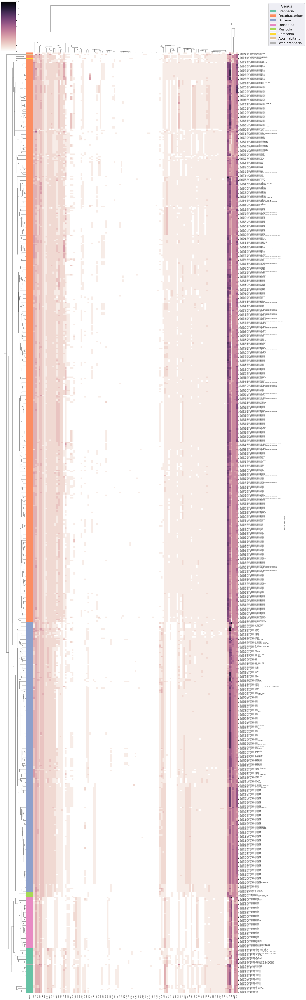

In [43]:
# make a figure the optimal size to fit in a paper
build_family_clustermap(
    fam_freq_df_ggs,
    row_colours=fam_freq_genus_row_colours,
    fig_size=(20,70),
    file_path="../results/cazy_families/paper_fam_freq_clustermap_FILTERED.svg",
    file_format='svg',
    font_scale=0.5,
    lut=fam_g_lut,
    legend_title='Genus',
    dendrogram_ratio=(0.1,0.05),
    title_fontsize=18,
    legend_fontsize=16,
    cbar_pos=(0, 0.95, 0.05, 0.05),
)

## Genus specific CAZy families

Identify CAZy families that are only present in one group, e.g. one Genus, using the function `get_group_specific_fams` from `cazomevolve`.

Specifically, `get_group_specific_fams` returns two `dicts`:
1. Group specific families: `{group: {only unique fams}}`
2. All families per group: `{group: {all fams}}`

In [44]:
all_families = list(fam_freq_df.columns)[3:]
# dict {group: {only unique fams}} and dict {group: {all fams}}
unique_grp_fams, group_fams = get_group_specific_fams(fam_freq_filtered_df, 'Genus', all_families)
unique_grp_fams

Identifying Genus specific fams: 100%|██████████| 8/8 [00:00<00:00, 11790.03it/s]


{'Brenneria': {'GH106', 'GT21', 'PL17'},
 'Pectobacterium': {'AA10',
  'CBM13',
  'GH121',
  'GH146',
  'GH18',
  'GT101',
  'GT102',
  'GT11',
  'GT111',
  'GT14',
  'GT24',
  'GT52',
  'PL11'},
 'Dickeya': {'CBM4', 'CE2', 'GH113', 'GH148', 'GH25', 'GH91', 'GT97', 'PL10'},
 'Acerihabitans': {'GH127', 'GH15'}}

## Identify phenotype specific CAZy families

Identify families that are only found in hard plant tissue targeting genomes, and those families only found in soft plant tissue targeting species.

In [45]:
hard_soft_fams_dict = {'hard': set(), 'soft': set()}

for ri in tqdm(range(len(fam_freq_filtered_df)), desc="Identifying Soft and Hard plant tissue targeting families"):
    genus = fam_freq_filtered_df.iloc[ri]['Genus']
    
    if genus in ['Pectobacterium','Dickeya','Musicola']:
        grp = 'soft'
    else:
        grp = 'hard'
    
    for fam in fam_freq_filtered_df.columns[3:]:
        if fam_freq_filtered_df.iloc[ri][fam] > 1:
            hard_soft_fams_dict[grp].add(fam)

unique_hard_fams = hard_soft_fams_dict['hard'].difference(hard_soft_fams_dict['soft'])
unique_soft_fams = hard_soft_fams_dict['soft'].difference(hard_soft_fams_dict['hard'])

print("Hard plant tissue targeting specific families:")
for fam in unique_hard_fams:
    print(fam)
print("Soft plant tissue targeting specific families:")
for fam in unique_soft_fams:
    print(fam)

Identifying Soft and Hard plant tissue targeting families:   0%|          | 0/711 [00:00<?, ?it/s]

Hard plant tissue targeting specific families:
GH77
PL22
GT20
GT28
CE1
CE11
GH31
GH37
Soft plant tissue targeting specific families:
CBM13
GH53
CBM63
GH94
GT97
GT19
AA3
GT1
PL4
CBM0
CBM32
GT30
GH5
PL9
GT56
GH103
GT41
GH30
GH102
GH2
GH38
GH18
PL26
GT32
GT84
PL2
CBM91


Compile all this data on genus and phenotype specific CAZy families into a single dataframe that will be similar to one presented in a paper/report.

In [46]:
# convert into df
unique_grp_data = []

unique_grp_fams['Hard tissue'] = unique_hard_fams
unique_grp_fams['Soft tissue'] = unique_soft_fams

for genus in unique_grp_fams:
    new_data = [genus]
    for cazy_class in ['GH', 'GT', 'CE', 'PL', 'AA', 'CBM']:
        added = False
        class_data = []
        for fam in unique_grp_fams[genus]:
            if fam.startswith(cazy_class):
                class_data.append(fam)
                added = True
        if added is False:
            class_data.append("")
        class_data.sort()
        new_data.append(", ".join(class_data))
            
    unique_grp_data.append(new_data)
    
unique_grp_df = pd.DataFrame(unique_grp_data, columns=['Genus', 'GH', 'GT', 'CE', 'PL', 'AA', 'CBM'])
unique_grp_df.to_csv("../results/cazy_families/unique_grp_fams.tsv", sep='\t')
unique_grp_df

,Genus,GH,GT,CE,PL,AA,CBM
0,Brenneria,GH106,GT21,,PL17,,
1,Pectobacterium,"GH121, GH146, GH18","GT101, GT102, GT11, GT111, GT14, GT24, GT52",,PL11,AA10,CBM13
2,Dickeya,"GH113, GH148, GH25, GH91",GT97,CE2,PL10,,CBM4
3,Acerihabitans,"GH127, GH15",,,,,
4,Hard tissue,"GH31, GH37, GH77","GT20, GT28","CE1, CE11",PL22,,
5,Soft tissue,"GH102, GH103, GH18, GH2, GH30, GH38, GH5, GH53...","GT1, GT19, GT30, GT32, GT41, GT56, GT84, GT97",,"PL2, PL26, PL4, PL9",AA3,"CBM0, CBM13, CBM32, CBM63, CBM91"


## Pectobacterium and Dickeya genus-specific families

_Pectobacterium_ and _Dickeya_ share a similar plant host range but show notable diversity in the compositions of the CAZyme-complements. drop all genomes not from _Pectobacterium_ and _Dickeya_ from the `fam_freq_df` dataframe, and repeat the analysis to identify genus specific CAZy families.

In [47]:
all_families = list(fam_freq_filtered_df.columns)[3:]
pd_fam_freq_df_filtered = fam_freq_filtered_df[fam_freq_filtered_df['Genus'].isin(
    ['Pectobacterium', 'Dickeya']
)]
# dict {group: {only unique fams}} and dict {group: {all fams}}
pd_unique_grp_fams, pd_group_fams = get_group_specific_fams(pd_fam_freq_df_filtered, 'Genus', all_families)
pd_unique_grp_fams

Identifying Genus specific fams: 100%|██████████| 2/2 [00:00<00:00, 12000.87it/s]


{'Pectobacterium': {'AA10',
  'CBM13',
  'CBM18',
  'CBM3',
  'CBM67',
  'GH108',
  'GH12',
  'GH121',
  'GH146',
  'GH153',
  'GH154',
  'GH18',
  'GH38',
  'GH65',
  'GH68',
  'GT101',
  'GT102',
  'GT11',
  'GT111',
  'GT14',
  'GT20',
  'GT24',
  'GT32',
  'GT52',
  'GT73',
  'PL11'},
 'Dickeya': {'CBM4',
  'CE2',
  'GH113',
  'GH148',
  'GH25',
  'GH26',
  'GH91',
  'GT97',
  'PL0',
  'PL10'}}

<a id="core-cazome"> </a>
# 4. The Core CAZome

Identify CAzy families that are present in every genome in the dataset using the `identify_core_cazome()` function from `cazomevolve`. These families form the 'core CAZome'.

The function takes one positional argument, a dataframe of CAZy family frequencies (with only CAZy families included in the columns, i.e no taxonomy columns). 

<div class="alert alert-danger">
    <b>Warning:</b> The CAZy family frequency dataframe provided to <\b>identify_core_cazome()<\b> must contain no columns listing taxonomic data. Each column must represent a unique CAZy family.
</div>

In [48]:
# make output directory
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/core_cazome/'), force=True, nodelete=True)

Built output directory: ../results/core_cazome


In [49]:
fam_freq_filtered_df_ggs = fam_freq_filtered_df.set_index(['Genome', 'Genus', 'Species'])

In [50]:
core_cazome = identify_core_cazome(fam_freq_filtered_df_ggs)

core_cazome = list(core_cazome)
core_cazome.sort()

print(f"Total families: {len(all_families)}")
print("The core CAZy families are:")
for fam in core_cazome:
    print('-', fam)

Identifying core CAZome: 100%|██████████| 117/117 [00:00<00:00, 7840.20it/s]

Total families: 117
The core CAZy families are:
- CBM5
- CBM50
- GH23
- GH3
- GT2
- GT51
- GT9


The boxplot shows the frequency of each CAZy family across all genomes in the dataframe. We can also break down this data by genus, and build a dataframe of Family, Genus (or tax rank of choice), genome, and frequency.

This dataframe can then be used to build a second dataframe of:
* Family
* Tax rank
* Mean frequency
* SD frequency
Which can be presented as is in a report, or imported into [RawGraphs](https://app.rawgraphs.io/) to build a matrix plot (aka a proporitonal area plot).

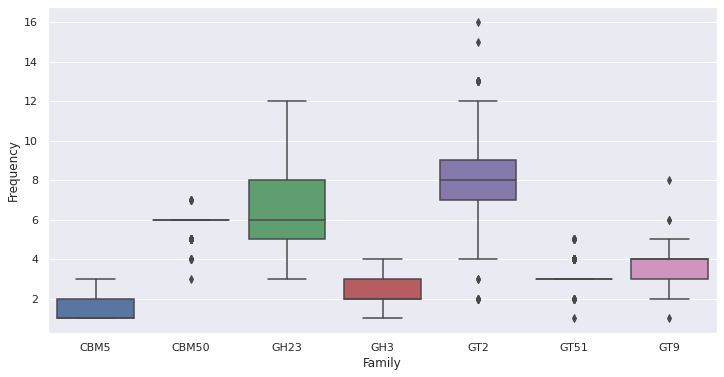

In [51]:
# filter the famil freq df to include only those families in the core CAZome
core_cazome_df = fam_freq_filtered_df_ggs[core_cazome]
plot_fam_boxplot(core_cazome_df, font_scale=0.8, fig_size=(12,6))

The boxplot shows the frequency of each core CAZy family across all _Pectobacteriaceae_. To break down the frequency by genus, build a dataframe with the mean (and SD) of frequency of each family in the core CAZome per genus. This dataframe can then be used to plot a proportional area plot of the mean frequency of each CAZy family per genus, for exampling using [RawGraphs](https://app.rawgraphs.io/).

In [52]:
core_cazome_df_genus = copy(core_cazome_df)  # to ensure core_cazome_df is not altereted
core_cazome_df_genus = add_tax_column_from_row_index(core_cazome_df_genus, 'Genus', 1)
core_cazome_df_genus.head()

,,,CBM5,CBM50,GH23,GH3,GT2,GT51,GT9,Genus
Genome,Genus,Species,,,,,,,,
GCA_005484945.1,Brenneria,rubrifaciens,1,6,6,2,8,3,3,Brenneria
GCA_003121725.1,Pectobacterium,atrosepticum,1,6,8,3,9,5,4,Pectobacterium
GCA_020406855.1,Pectobacterium,carotovorum,1,6,6,2,9,3,3,Pectobacterium
GCA_003121785.1,Pectobacterium,parmentieri,1,6,6,3,11,4,3,Pectobacterium
GCA_022748065.1,Dickeya,dianthicola,2,6,4,3,8,3,4,Dickeya


In [53]:
core_cazome_fggf_df, core_cazome_mean_freq_df = build_fam_mean_freq_df(
    core_cazome_df_genus,
    'Genus',
    round_by=2,
)

# add rows showing the means across all pectobacteriaceae
all_pecto_core_fam_data = []
for fam in core_cazome_df_genus.columns:
    try:
        mean_freq = np.mean(core_cazome_df_genus[fam]).round(2)
        sd_freq = np.std(core_cazome_df_genus[fam]).round(2)
        all_pecto_core_fam_data.append([fam, 'Pectobacteriaceae', mean_freq, sd_freq])
    except TypeError: # tax column
        continue
    
temp_df = pd.DataFrame(all_pecto_core_fam_data, columns=['Family','Genus','MeanFreq','SdFreq'])
core_cazome_mean_freq_df = pd.concat([core_cazome_mean_freq_df, temp_df])

core_cazome_mean_freq_df.to_csv("../results/core_cazome/core_cazome_freqs.csv")

core_cazome_mean_freq_df

Building [Fam, grp, mean freq, sd freq] df: 100%|██████████| 8/8 [00:00<00:00, 116.25it/s]


,Family,Genus,MeanFreq,SdFreq
0,CBM5,Dickeya,1.99,0.12
1,CBM50,Dickeya,5.97,0.28
2,GH23,Dickeya,6.04,1.44
3,GH3,Dickeya,3.04,0.26
4,GT2,Dickeya,9.50,1.79
...,...,...,...,...
2,GH23,Pectobacteriaceae,6.49,1.55
3,GH3,Pectobacteriaceae,2.49,0.60
4,GT2,Pectobacteriaceae,8.15,2.10
5,GT51,Pectobacteriaceae,3.08,0.37


## Genus specific core CAZomes

As well as looking at the core CAZome across all _Pectobacteriaceae_, we can identify the core CAZome of each genus. This is still done using the `identify_core_cazome()` function from `cazomevolve`, however, we filter the dataframe each time to retain only rows with data for the genera of interest.

These data (listing the genus specific core CAZomes) is used to aupsetplot to highlight the differences and similarities between the core CAZomes.

<div class="alert alert-info">
    <b>Note:</b> Only generate that are represented by more than one genome are included in this analysis of genus specific core CAZomes. Otherwise, for genera with only one genome representative, all families in that one genome will be listed in the core CAZome.
</div>

In [54]:
genera_of_interest = ['Pectobacterium', 'Dickeya', 'Musicola', 'Brenneria', 'Lonsdalea']
all_families = fam_freq_filtered_df_ggs.columns

core_cazomes = {}  # {genus: {fams}}
for genus in genera_of_interest:
    filtered_df = fam_freq_filtered_df[fam_freq_filtered_df['Genus'] == genus]
    temp_core_cazome = identify_core_cazome(filtered_df[all_families])
    temp_core_cazome = list(temp_core_cazome)
    temp_core_cazome.sort()
    core_cazomes[genus] = {'fams': temp_core_cazome, 'freqs': {len(filtered_df)}}
    
core_cazomes

Identifying core CAZome: 100%|██████████| 117/117 [00:00<00:00, 16493.58it/s]


{'Pectobacterium': {'fams': ['CBM5',
   'CBM50',
   'GH1',
   'GH103',
   'GH23',
   'GH28',
   'GH3',
   'GH43',
   'GT2',
   'GT51',
   'GT9',
   'PL1',
   'PL2',
   'PL22',
   'PL3',
   'PL9'],
  'freqs': {426}},
 'Dickeya': {'fams': ['CBM48',
   'CBM5',
   'CBM50',
   'CE4',
   'CE8',
   'GH1',
   'GH103',
   'GH105',
   'GH13',
   'GH23',
   'GH28',
   'GH3',
   'GH33',
   'GH73',
   'GH77',
   'GH8',
   'GT1',
   'GT19',
   'GT2',
   'GT28',
   'GT35',
   'GT4',
   'GT5',
   'GT51',
   'GT9',
   'PL1',
   'PL9'],
  'freqs': {206}},
 'Musicola': {'fams': ['CBM48',
   'CBM5',
   'CBM50',
   'CE1',
   'CE11',
   'CE12',
   'CE4',
   'CE8',
   'CE9',
   'GH1',
   'GH102',
   'GH103',
   'GH104',
   'GH105',
   'GH13',
   'GH19',
   'GH2',
   'GH23',
   'GH28',
   'GH3',
   'GH30',
   'GH31',
   'GH32',
   'GH33',
   'GH38',
   'GH5',
   'GH73',
   'GH77',
   'GH8',
   'GT0',
   'GT1',
   'GT19',
   'GT2',
   'GT26',
   'GT28',
   'GT30',
   'GT35',
   'GT4',
   'GT5',
   'GT51',
   '

In [55]:
core_cazome_upsetplot_membership = []
core_cazome_upsetplot_membership = add_to_upsetplot_membership(
    core_cazome_upsetplot_membership,
    core_cazomes,
)
len(core_cazome_upsetplot_membership)

708

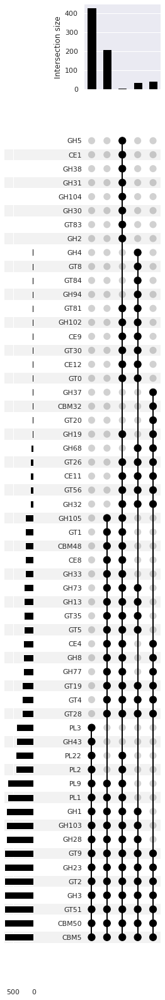

In [56]:
core_cazome_upsetplot = build_upsetplot(
    core_cazome_upsetplot_membership,
    sort_by='input',
    file_path='../results/core_cazome/genera_core_cazome.svg',
)

## Phenotype specific core CAZomes

Again by filtering the rows in the dataframe of CAZyme family frequencies, we can identify a core CAZome in any custom subset of genomes. This includes identifing the core CAZomes in soft and hard plant tissue targeting _Pectobacteriaceae_ CAZomes.

In [57]:
soft_genera = ['Pectobacterium', 'Dickeya', 'Musicola']
hard_genera = ['Brenneria', 'Lonsdalea', 'Samsonia', 'Affinibrenneria', 'Acerihabitans']
grps = [[soft_genera, 'Soft tissue targeting'], [hard_genera, 'Hard tissue targeting']]

all_families = fam_freq_filtered_df_ggs.columns

soft_hard_core_cazomes = {}  # {grp: {fams}}
for grp in tqdm(grps):
    # gather all rows containing the genera of interest
    filtered_df = fam_freq_filtered_df[fam_freq_filtered_df['Genus'].isin(grp[0])]
    temp_core_cazome = identify_core_cazome(filtered_df[all_families])
    temp_core_cazome = list(temp_core_cazome)
    temp_core_cazome.sort()
    try:
        soft_hard_core_cazomes[grp[1]]
    except KeyError:
        soft_hard_core_cazomes[grp[1]] = {'fams': set(), 'freqs': [0]}

    soft_hard_core_cazomes[grp[1]]['fams'] = soft_hard_core_cazomes[grp[1]]['fams'].union(
        set(temp_core_cazome)
    )
    soft_hard_core_cazomes[grp[1]]['freqs'][0] += len(filtered_df)
    
soft_hard_core_cazomes

  0%|          | 0/2 [00:00<?, ?it/s]


Identifying core CAZome: 100%|██████████| 117/117 [00:00<00:00, 8325.00it/s]

Identifying core CAZome: 100%|██████████| 117/117 [00:00<00:00, 15449.36it/s]


{'Soft tissue targeting': {'fams': {'CBM5',
   'CBM50',
   'GH1',
   'GH103',
   'GH23',
   'GH28',
   'GH3',
   'GT2',
   'GT51',
   'GT9',
   'PL1',
   'PL9'},
  'freqs': [636]},
 'Hard tissue targeting': {'fams': {'CBM5',
   'CBM50',
   'CE11',
   'GH23',
   'GH3',
   'GT19',
   'GT2',
   'GT26',
   'GT28',
   'GT4',
   'GT51',
   'GT56',
   'GT9'},
  'freqs': [75]}}

In [58]:
soft_hard_core_cazomes.update(core_cazomes)

In [59]:
core_cazome_upsetplot_membership = []
core_cazome_upsetplot_membership = add_to_upsetplot_membership(
    core_cazome_upsetplot_membership,
    soft_hard_core_cazomes,
)
len(core_cazome_upsetplot_membership)

1419

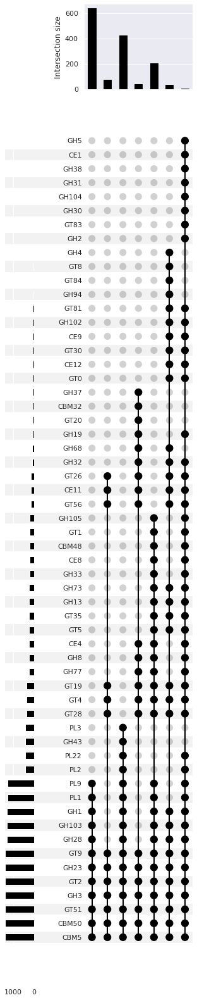

In [60]:
core_cazome_upsetplot = build_upsetplot(
    core_cazome_upsetplot_membership,
    file_path='../results/core_cazome/genera_soft_hard_core_cazome.svg',
)

<a id="co-occurring"> </a>
# 5. Families that always occur together

We can use `cazomevolve` to identify CAZy families that are always present in a genome together, although each group of always co-occurring CAZy families may not be present in every genomes. 

<div class="alert alert-info">
    <b>Note:</b> This approach is extremely stringent with its definition. It does not not tolerate one CAZy family <b>ever</b> appearing without the other family in the same genome.
</div>

In [61]:
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/cooccurring_families/'), force=True, nodelete=True)

# reminder of the structure of the df
fam_freq_filtered_df.head(1)

Built output directory: ../results/cooccurring_families


,Genome,Genus,Species,AA10,AA3,CBM0,CBM13,CBM18,CBM3,CBM32,...,PL11,PL17,PL2,PL22,PL26,PL3,PL35,PL38,PL4,PL9
0,GCA_005484945.1,Brenneria,rubrifaciens,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0


## Using a correlation matrix

There are two approaches are implemented by `cazomevolve` to idenitfy CAZy families that always co-occur together. The first generates a correlation matrix. 

CAZy families that always appear together can be identified by generating a correlation matrix using the Python package `pandas`, CAZy families that are always present together will have a correlation matrix of 1. 

This can be done using the `identify_cooccurring_fams_corrM()` function. CAZy families that are always present in the genome (i.e. the core CAZome), or are absent from all genomes will be calulcated to have a correlation score of `nan`.

<div class="alert alert-info">
    <b>Note:</b> In order to plot the correlation matrix, the <b>fill_value</b> key word for <b>identify_cooccurring_fams_corrM()</b> can be used to replace all <b>nan</b> values with an interger.
</div>

`identify_cooccurring_fams_corrM()` returns:

* a set of tuples, one tuple per group of always co-occurring CAZy families
* a correlation matrix

In [62]:
all_families = list(fam_freq_filtered_df.columns[3:])

cooccurring_families, fam_corr_M_filled = identify_cooccurring_fams_corrM(
    fam_freq_filtered_df,
    all_families,
    core_cazome=[],
    corrM_path="../results/cooccurring_families/fam_corr_M_filled.csv",
    fill_value=2,
)

Identifying always co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 1879.45it/s]


In [63]:
cooccurring_families

{('CBM4', 'GH148'), ('GH121', 'GH146'), ('GH127', 'GH15'), ('GH94', 'GT84')}

Generate a clustermap of the correlation matrix.

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


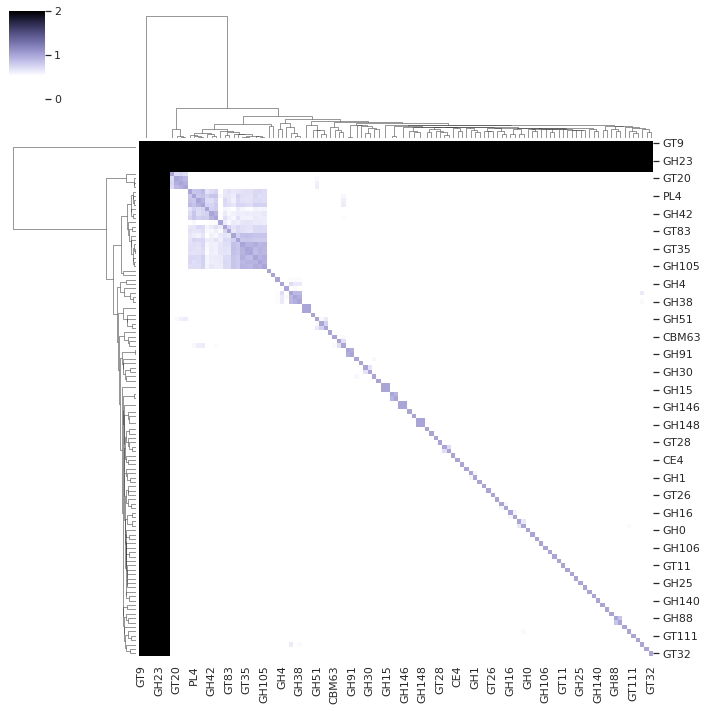

In [64]:
sns.clustermap(
    fam_corr_M_filled,
    cmap=sns.cubehelix_palette(rot=0, dark=2, light=0, reverse=True, as_cmap=True),
)

## An iterative approach to identify co-occurring families

The second method implemented by `cazomevolve` to identify CAZy families that always co-occur together is an iterative approach:

Iterate through the dataframe of CAZy family frequencies in _Pectobacteriaceae_ (`fam_freq_df_filtered`) and identify the groups of always co-occurring CAZy families (i.e. those families that are always present together) and count the number of genomes in which the families are present together.

This is done using the `cazomevolve` function `calc_cooccuring_fam_freqs()`, which returns a dictionary of groups of co-occurring CAZy families. The function takes as input:
1. The dataframe of CAZy family frequencies (it can include taxonomy information in columns)
2. A list of the CAZy families to analyse
3. (Optional) whether to include or exclude the core CAZome from the list of always co-occurring CAZy families.

In [65]:
cooccurring_fams_dict = calc_cooccuring_fam_freqs(
    fam_freq_filtered_df,
    list(all_families),
    exclude_core_cazome=False,
)
cooccurring_fams_dict

Combining pairs of co-occurring families: 100%|██████████| 25/25 [00:00<00:00, 168581.35it/s]


{0: {'fams': {'CBM4', 'GH148'}, 'freqs': {8}},
 1: {'fams': {'CBM5', 'CBM50', 'GH23', 'GH3', 'GT2', 'GT51', 'GT9'},
  'freqs': {711}},
 2: {'fams': {'GH121', 'GH146'}, 'freqs': {1}},
 3: {'fams': {'GH127', 'GH15'}, 'freqs': {1}},
 4: {'fams': {'GH94', 'GT84'}, 'freqs': {309}}}

## Genus specific groups of always co-occurring CAZy families

Similar to above when exploring core CAZomes, we can filiter the dataframe of CAZy family frequencies and run the analysis to identify always co-occurring CAZy families on custom subsets of genomes.

In this instance we reran the analysis for each genus in _Pectobacteriaceae_ to identify genus specific groups of always co-occurring CAZy families.

<div class="alert alert-warning">
    <b>Note:</b> We limited the analysis to only those genera represented by more than one genome. Looking at genera where only one genome was analysed, all families in the genome will be listed as always co-occurring.
</div>

In [66]:
genera_cooccuring_fams = {}  # {genus: cooccurring_fams_dict}

for genus in tqdm(
    ['Pectobacterium', 'Dickeya', 'Musicola', 'Lonsdalea', 'Brenneria'],
    desc="Identifying genus specific co-occurring fams",
):
    genus_fam_freq_df = fam_freq_filtered_df[fam_freq_filtered_df['Genus'] == genus]
    genus_cooccurring_fams_dict = calc_cooccuring_fam_freqs(
        genus_fam_freq_df,
        list(all_families),
        exclude_core_cazome=False,
    )
    genera_cooccuring_fams[genus] = genus_cooccurring_fams_dict
genera_cooccuring_fams

Identifying genus specific co-occurring fams:   0%|          | 0/5 [00:00<?, ?it/s]


Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:01<00:00, 113.30it/s]

Combining pairs of co-occurring families: 100%|██████████| 135/135 [00:00<00:00, 381557.30it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 224.57it/s][A

Combining pairs of co-occurring families: 100%|██████████| 361/361 [00:00<00:00, 508613.95it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 1062.60it/s]

Combining pairs of co-occurring families: 100%|██████████| 1130/1130 [00:00<00:00, 796030.15it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 908.82it/s][A

Combining pairs of co-occurring families: 100%|██████████| 255/255 [00:00<00:00, 578446.47it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 594.72it/s][A

Combining pairs of co-occurring families: 100%|██████████| 500/500 [00:00<00:00, 676282.49it/s]


{'Pectobacterium': {0: {'fams': {'CBM3', 'GH5'}, 'freqs': {425}},
  1: {'fams': {'CBM48', 'CE8', 'CE9', 'GH13'}, 'freqs': {425}},
  2: {'fams': {'CBM5',
    'CBM50',
    'GH1',
    'GH103',
    'GH23',
    'GH28',
    'GH3',
    'GH43',
    'GT2',
    'GT51',
    'GT9',
    'PL1',
    'PL2',
    'PL22',
    'PL3',
    'PL9'},
   'freqs': {426}},
  3: {'fams': {'CE11', 'GH102', 'GH32'}, 'freqs': {425}},
  4: {'fams': {'GH105', 'GT56'}, 'freqs': {425}},
  5: {'fams': {'GH121', 'GH146', 'GH154'}, 'freqs': {1}},
  6: {'fams': {'GH94', 'GT84'}, 'freqs': {152}}},
 'Dickeya': {0: {'fams': {'CBM4', 'GH148'}, 'freqs': {8}},
  1: {'fams': {'CBM48',
    'CBM5',
    'CBM50',
    'CE4',
    'CE8',
    'GH1',
    'GH103',
    'GH105',
    'GH13',
    'GH23',
    'GH28',
    'GH3',
    'GH33',
    'GH73',
    'GH77',
    'GH8',
    'GT1',
    'GT19',
    'GT2',
    'GT28',
    'GT35',
    'GT4',
    'GT5',
    'GT51',
    'GT9',
    'PL1',
    'PL9'},
   'freqs': {206}},
  2: {'fams': {'CE11', 'GT83'

## Phenotype specific groups of always co-occurring CAZy families

Identify families that always co-occurring in soft and hard plant tissue genera.

In [67]:
soft_genera = ['Pectobacterium', 'Dickeya', 'Musicola']
hard_genera = ['Brenneria', 'Lonsdalea', 'Samsonia', 'Affinibrenneria', 'Acerihabitans']
# hard_genera = ['Brenneria', 'Lonsdalea']
grps = [[soft_genera, 'Soft tissue targeting'], [hard_genera, 'Hard tissue targeting']]

for grp in tqdm(grps):
    # gather all rows containing the genera of interest
    grp_fam_freq_df = fam_freq_filtered_df[fam_freq_filtered_df['Genus'].isin(grp[0])]
    
    grp_cooccurring_fams_dict = calc_cooccuring_fam_freqs(
        grp_fam_freq_df,
        list(all_families),
        exclude_core_cazome=False,
    )
    genera_cooccuring_fams[grp[1]] = grp_cooccurring_fams_dict

  0%|          | 0/2 [00:00<?, ?it/s]


Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:01<00:00, 75.87it/s]

Combining pairs of co-occurring families: 100%|██████████| 75/75 [00:00<00:00, 317109.68it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 398.74it/s][A

Combining pairs of co-occurring families: 100%|██████████| 91/91 [00:00<00:00, 388282.47it/s]


## Build an upset plot of co-occurring CAZy families

One of the best ways to visualise the groups of always co-occurring CAZy families is to generate an upset plot.

Build an upsetplot (using the Python package `upsetplot`) to visulise the groups of always co-occurring CAZy families, additionally it will plot the number of genomes in which each group of co-occurring CAZy families were present.

First compile the data/membership for the upset plot by:
1. Creating an empty list to store the upset plot data
2. Adding to the empty list the data contained in each dictionary of co-occurring CAZy families by using the `add_to_upsetplot_membership()` function

In [68]:
upsetplot_membership = []
upsetplot_membership = add_to_upsetplot_membership(upsetplot_membership, cooccurring_fams_dict)

for genus in genera_cooccuring_fams:
    upsetplot_membership = add_to_upsetplot_membership(
        upsetplot_membership,
        genera_cooccuring_fams[genus],
    )

len(upsetplot_membership)

7233

### Build the upset plot

Building the upset plot will include the core CAZomes across _Pectobacteriaceae_, per genus, and per all soft plant tissue targeting genera and all hard plant tissue targeting genera.

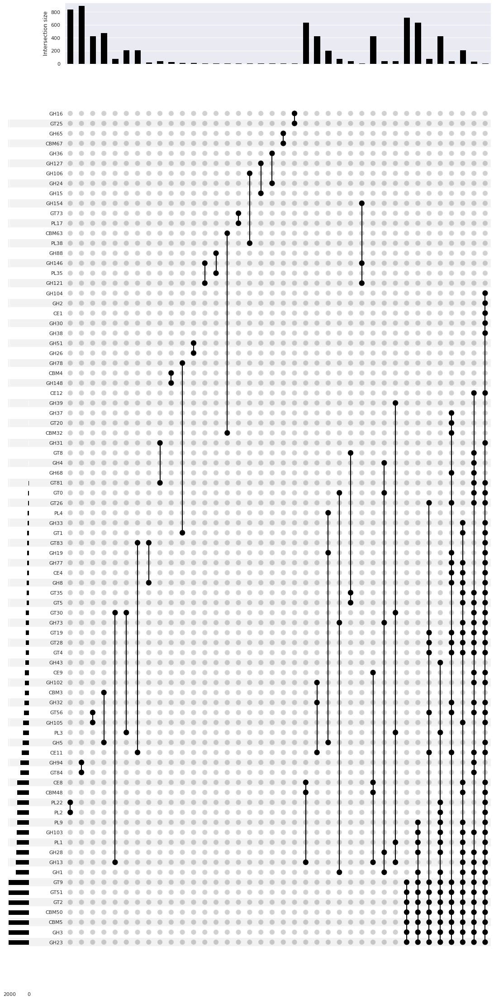

In [69]:
pectobact_upsetplot = build_upsetplot(
    upsetplot_membership,
    file_path='../results/cooccurring_families/pecto-cooccurring-families.svg',
)

#### Break down the incidences per genus

The upset plot generates a bar chart showing the number of genomes that each group of co-occuring CAZy families appeared in. However, this plots the total number across each of the groups (i.e. _Pectobacterium_, _Dickeya_, etc.).

To break down the indidence (i.e. the number of genomes that each group of co-occurring CAZy families were present in) per group, a dataframe listing each group of co-occurring CAZy families, the group (i.e. genus), and the respective frequency must be generated. This dataframe can then be used to generate a proportional area plot (or matrix plot), breaking down the incidence per group (i.e. genus).

The groups of co-occurring CAZy families must be listed in the same order as they are presented in the upset plot.

In [70]:
upset_plot_groups = get_upsetplot_grps(upsetplot_membership)

100%|██████████| 38/38 [00:01<00:00, 20.98it/s]


Compiling the data of the incidence of each grp of co-occurring CAZy families per group of interest (e.g. per genus), into a single dataframe.

Create an empty list to store all data for the dataframe, then use `add_upsetplot_grp_freqs` to add data of the incidence per group of co-occurring CAZy families to the list. `build_upsetplot_matrix` is then used to build the dataframe.

In [71]:
cooccurring_grp_freq_data = []  # empty list to store data for the df

# add pectobacteriaceae data
genera_cooccuring_fams['Pectobacteriaceae'] = cooccurring_fams_dict

# add data for each genus, all soft plant targeting and hard plant tissue targeting
cooccurring_grp_freq_data = add_upsetplot_grp_freqs(
    upset_plot_groups,
    cooccurring_grp_freq_data,
    genera_cooccuring_fams,
    genus,
    grp_sep=True,
    grp_order=[
        'Pectobacteriaceae', 
        'Pectobacterium', 'Dickeya', 'Musicola', 'Soft tissue targeting',
        'Brenneria', 'Lonsdalea', 'Hard tissue targeting',
    ],
    include_none=True,
)

Compiling co-occurring families incidence data: 100%|██████████| 38/38 [00:00<00:00, 32146.74it/s]


Build a single dataframe of co-occurring families, freq and group (e.g. genus).

But also list the information for each group in the same order the groups of CAZy families are listed in the upset plot. This allows a proportional area plot to be generated (for example, by using [RawGraphs](https://app.rawgraphs.io/)), which can then be combined with the upset plot (for example, using [inkscape](https://inkscape.org/)).

In [72]:
# build the dataframe
cooccurring_fams_freq_df = build_upsetplot_matrix(
    cooccurring_grp_freq_data,
    'Genus',
    file_path='../results/cooccurring_families/cooccurring_fams_freqs.csv',
)
cooccurring_fams_freq_df

,Families,Genus,Incidence
0,PL2+PL22,Pectobacteriaceae,NaN
1,PL2+PL22,Pectobacterium,NaN
2,PL2+PL22,Dickeya,205.0
3,PL2+PL22,Musicola,NaN
4,PL2+PL22,Soft tissue targeting,635.0
...,...,...,...
299,GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28...,Musicola,4.0
300,GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28...,Soft tissue targeting,NaN
301,GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28...,Brenneria,NaN
302,GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28...,Lonsdalea,NaN


## Generate figure for paper

After analysing the data, mannually group of the soft and hard tissue targeting specific groups of CAZy families together and mannually define the order the groups are presented in the final upset plot (by setting the param `sort_by` to `'input'`).

In [73]:
grp_order = {
    'soft_grps': [  # grps only found in soft plant tissue targeting genomes
        'GH13+CBM48+CE8', # S
        'PL2+PL22', # # S D
        'GH148+CBM4', # S D
        'PL3+GT30', # D
        'PL35+GH88', # D
        'CE11+GT83', # D
        'GT25+GH16', # D
        'GH5+GH19+PL4', # D
        'GH121+GH146+GH154', # S P   
        'GH121+GH146',
        'GH105+GT56', # P
        'GH13+CBM48+CE8+CE9',  # P
        'CE11+GH32+GH102', # P
        
    ],
    'musicola': [  # grps found only in musicola
        'CBM32+CBM63',
        'GH24+GH36',
    ],
    'both_grps': [  # grps found in soft and hard plant tissue targeting genomes
        'GT84+GH94', # 
        'GH5+CBM3', #
    ],
    'hard_musicola_grps': [  # grps only found in hard plant tissue targeting genomes and Musicola
        'GH13+GT30',
        'GH1+GH73+GT0',
        'GT5+GT35+GT8',
        'GH15+GH127',
        'GT81+GH31', # L
        'GH8+GT83', # B
    ],
    'hard_grps': [ # grps only found in hard plant tissue targeting genomes
        'CBM67+GH65', # H
        'PL17+GT73', # L B
        'PL38+GH106', # L B
        'GT1+GH78', # L
        'GH26+GH51', # L
        'GH1+GH28+GH73+GT0+GH4',
        'GH13+PL1+PL3+GT30+GH39',
    ],
    'all_core_cazomes': [ # then core cazomes at the end
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9',  # pectobacteriaceae
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH28+PL1+GH103+PL9',  # soft plant tissue targeting
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+PL1+GH103+PL9+CBM48+CE8+GH105+GT4+GT28+GT19+GH73+GT5+GT35+GH8+CE4+GH77+GT1+GH33',   # dickeya
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH28+PL1+GH103+PL9+PL2+PL22+PL3+GH43', # pectobacter 
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+PL1+GH103+PL9+PL2+PL22+CBM48+CE8+CE11+GH5+GH105+GT56+GH32+GH102+CE9+GT4+GT28+GT19+GH73+GT30+GT5+GT35+GH8+CE4+GH77+GH19+GT83+GT1+GH33+GT26+GT0+GT81+GH31+CE12+GH38+GH30+CE1+GH2+GH104',  # musicola
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+CE11+GT56+GT4+GT28+GT19+GT26',  # hard
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+CE11+GT56+GH32+GT4+GT28+GT19+GH8+CE4+GH77+GH19+GT26+GH68+CBM32+GT20+GH37',   # lonsdalea
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+GH103+GT84+GH94+CE11+GT56+GH32+GH102+CE9+GT4+GT28+GT19+GH73+GT30+GT5+GT35+GT26+GT0+GT81+GH68+GH4+GT8+CE12', # bren
    ],
}
for grp in grp_order:
    grps = []
    for fams_str in grp_order[grp]:
        fams_list = fams_str.split("+")
        fams_list.sort()
        fams = "+".join(fams_list)
        grps.append(fams)
    grp_order[grp] = grps

In [74]:
paper_cooccurring_fams = {}  # {grp_num: {'fams': {fams}, 'freqs': {int}}}
num_of_grp = 0

for pheno_grp in grp_order:
    for fam_grp in grp_order[pheno_grp]:
        fams = fam_grp.split("+")
        fams.sort()
        
        for genus in ['Pectobacterium', 'Dickeya', 'Musicola', 'Soft tissue targeting', 'Hard tissue targeting', 'Brenneria', 'Lonsdalea']:
            # {grp num: {'fams': {fams}, 'freqs': {int}}}
            
            for grp_num in genera_cooccuring_fams[genus]:
                grp_fams = list(genera_cooccuring_fams[genus][grp_num]['fams'])
                grp_fams.sort()
                
                if grp_fams == fams:
                    
                    this_grp_num = None
                    
                    for co_grp_num in paper_cooccurring_fams:
                        if paper_cooccurring_fams[co_grp_num]['fams'] == genera_cooccuring_fams[genus][grp_num]['fams']:
                            this_grp_num = co_grp_num
                            
                    if this_grp_num is None:
                        this_grp_num = copy(num_of_grp)
                    
                        paper_cooccurring_fams[this_grp_num] = {
                            'fams': genera_cooccuring_fams[genus][grp_num]['fams'],
                            'freqs': genera_cooccuring_fams[genus][grp_num]['freqs']
                        }
                        
                        num_of_grp += 1

In [75]:
upsetplot_membership = []
upsetplot_membership = add_to_upsetplot_membership(upsetplot_membership, paper_cooccurring_fams)
len(upsetplot_membership)

5076

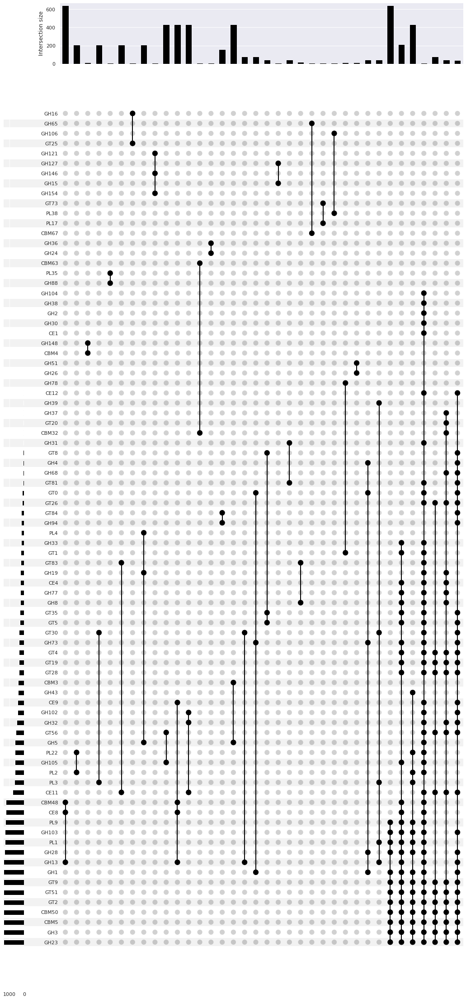

In [76]:
pectobact_upsetplot = build_upsetplot(
    upsetplot_membership,
    file_path='../results/cooccurring_families/paper-pecto-cooccurring-families.svg',
    sort_by='input',
)

Calculate the frequency of each group per genus to then build a matrix plot (or proportional area plot).

In [77]:
paper_cooccurring_freqs = []  # [fams, genus/grp, incidence/freq]
num_of_grp = 0

for grp_name in grp_order:
    for fams in grp_order[grp_name]:
        fams = fams.split("+")
        fams.sort()

        for genus in ['Soft tissue targeting', 'Pectobacterium', 'Dickeya', 'Musicola', 'Hard tissue targeting', 'Brenneria', 'Lonsdalea']:
            # {grp num: {'fams': {fams}, 'freqs': {int}}}

            for grp_num in genera_cooccuring_fams[genus]:
                grp_fams = list(genera_cooccuring_fams[genus][grp_num]['fams'])
                grp_fams.sort()

                if grp_fams == fams:
                    # found fams in genus

                    paper_cooccurring_freqs.append(
                        [
                            genera_cooccuring_fams[genus][grp_num]['fams'],
                            genus,
                            list(genera_cooccuring_fams[genus][grp_num]['freqs'])[0],
                        ]
                    )

In [78]:
# build the dataframe
cooccurring_fams_freq_df = build_upsetplot_matrix(
    paper_cooccurring_freqs,
    'Genus',
    file_path='../results/cooccurring_families/paper-cooccurring_fams_freqs.csv',
)
cooccurring_fams_freq_df

,Families,Genus,Incidence
0,"{CBM48, CE8, GH13}",Soft tissue targeting,635
1,"{PL22, PL2}",Soft tissue targeting,635
2,"{PL22, PL2}",Dickeya,205
3,"{CBM4, GH148}",Soft tissue targeting,8
4,"{CBM4, GH148}",Dickeya,8
5,"{GT30, PL3}",Dickeya,205
6,"{PL35, GH88}",Dickeya,3
7,"{CE11, GT83}",Dickeya,204
8,"{GH16, GT25}",Dickeya,1
9,"{GH5, PL4, GH19}",Dickeya,203


<a id="pca"></a>
# 6. Principal Component Analysis (PCA)

Use principal component analysis to identify individual and groups of CAZy families that are strongly associated with divergence between the _Pectobacteriaceae_ genera CAZomes in terms of CAZy family frequencies. 

**What is PCA?:**

Principal component analysis (PCA) is a statistical method that transforms a high dimensional data set into a low dimensional data set, while retaining as much information as possible. This dimensional reduction is achieved through the generation of principal components (PCs). Each PC is a direction along which variation in the data set is maximal. The first PC (PC1) captures the greatest diversity in the data set, the second PC (PC2) the second greatest direversity, and so on. Each PC represents a group of variables in the original data set, with each variable contributing a different weighting to the PC. A single variable can be associated with more than one PC. The relationships between variables and PCs can be visualised by plotting the loadings (or weightings) for each varaible along each PC.

## PCA

Use the `cazomevolve` function `perform_pca()` to perform a PCA on a dataframe where each row is a genome, and each column the frequency of a unique CAZy family - the columns in the dataframe must only contain numerical data (i.e. no taxonomic data).

In [79]:
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/pca/'), force=True, nodelete=True)

Built output directory: ../results/pca


In [80]:
num_of_components = len(fam_freq_filtered_df_ggs.columns)
pectobact_pca, X_scaled = perform_pca(fam_freq_filtered_df_ggs, num_of_components)
pectobact_pca

PCA(n_components=117)

### Explained cumulative variance

Explore the amount of variance in the dataset that is captured by the dimensional reduction performed by the PCA.

100.0% of the variance in the data set was catpured by the PCA
Number of features needed to explain 0.95 fraction of total variance is 59. 


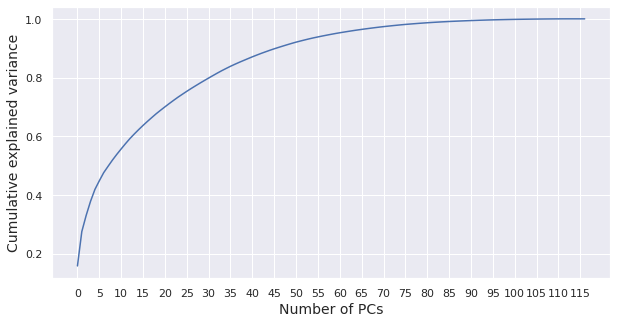

In [81]:
print(
    f"{round(pectobact_pca.explained_variance_ratio_.sum() * 100, 2)}% "
    "of the variance in the data set was catpured by the PCA"
)

cumExpVar = plot_explained_variance(
    pectobact_pca,
    num_of_components,
    file_path="../results/pca/pca_explained_variance.png",
)

### Variance captured per PC

Explore the variance in the data that is captured by each PC.

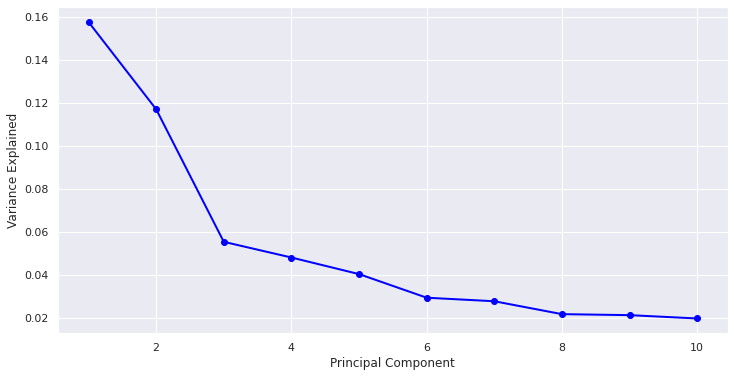

Explained variance for 1PC: 0.1578167077631129
Explained variance for 2PC: 0.11714531745192668
Explained variance for 3PC: 0.055353539233033246
Explained variance for 4PC: 0.04804711615760428
Explained variance for 5PC: 0.04031600741870648
Explained variance for 6PC: 0.029313990173379968
Explained variance for 7PC: 0.027663834661362074
Explained variance for 8PC: 0.02165359970544143
Explained variance for 9PC: 0.02118856319918562
Explained variance for 10PC: 0.019638464318788136


In [82]:
plot_scree(pectobact_pca, nComp=10, file_path="../results/pca/pectobact_pca_scree.png")

PC1 (15%) and PC2 (11%) capture a signficantly greater degree of the varaince in the data set than all other PCs.  
PC3 (6%) and PC4 (5%) capture comparable degrees of the variance

### Scatter and loadings plots

To explore the variance captured by each PC, plot different combinations of PCs onto a scatter plot where each axis represents a different PC and each point on the plot is a genome in the data set, using the `plot_pca()` function.

`plot_pca()` takes 6 positional argumets:
1. PCA object from `peform_pca()`
2. Scaling object (X_scaled) from `perform_pca()`
3. The dataframe of CAZy family frequencies, if you want to colour code the genomes by a specific grouping (i.e. by Genus), an additional column containing the grouping information needs to be added to the dataframe (e.g. listing the genus per genome)
4. The number of the first PC to be plotted, e.g. 1 for PC1 - int
5. The number of the second PC to be plotted, e.g. 2 for PC2 - int
6. The method to colour code the genomes by (e.g. 'Genus') - needs to match the name of the column containing the data in the dataframe of CAZy family frequencies

Owing to the majoirty of the variance captured by the PCA being captured by PCs 1-4, all possible combinations of these PCs were explored.

## PCs 1 - 4

The PCs 1-4 capture more diversity in the data set than the other PCs, therefore, plot all combinations of these PCs against each other, projecting the genomes onto these PCs.

A pairplot is generated using `Seaborn`, plotting each potential pairs between PCs 1-4. A KDE plot (a special type of density or histogram plot) is generated on the diagonal.

First colour code and style each point (where each point represents a genome) by its genus classification.

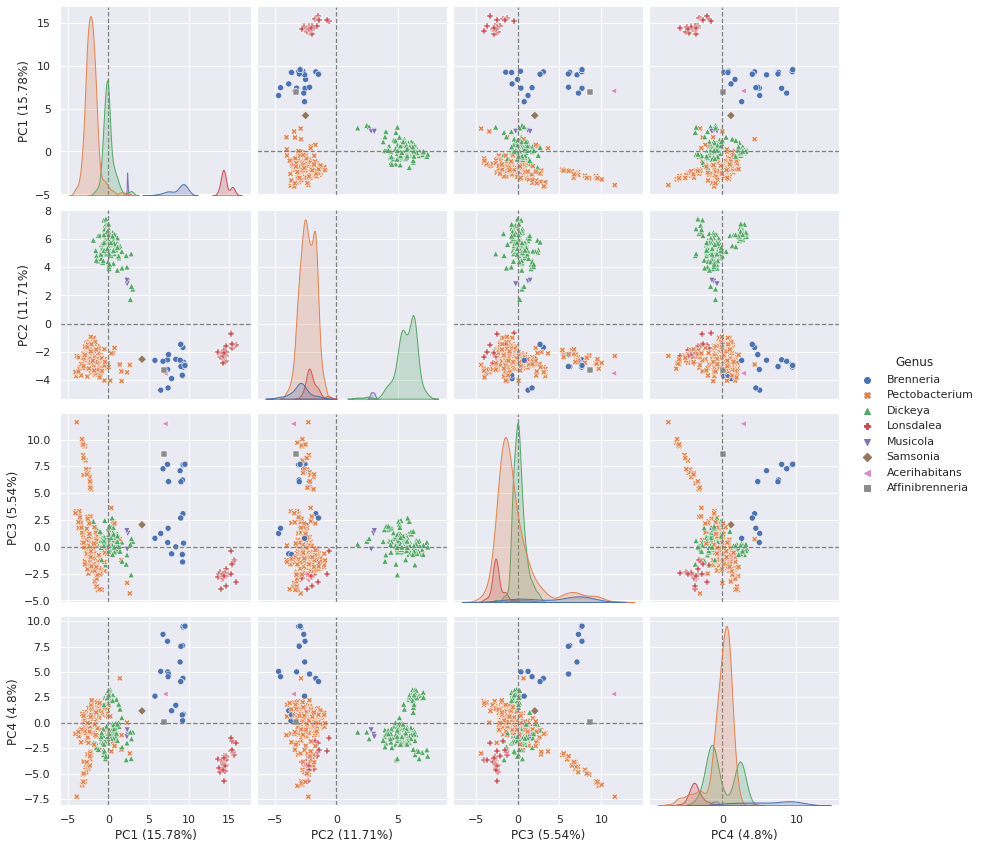

In [83]:
fam_freq_filtered_df_ggs['Genus'] = list(fam_freq_filtered_df['Genus'])
fam_freq_filtered_df_ggs['Species'] = list(fam_freq_filtered_df['Species'])

X_pca = pectobact_pca.transform(X_scaled)

fam_freq_df_ggs_pc = copy(fam_freq_filtered_df_ggs)
colnames = []
for i in range(4):
    fam_freq_df_ggs_pc[f'PC{i+1} ({round(pectobact_pca.explained_variance_ratio_[i] * 100, 2)}%)'] = X_pca[:,i]
    colnames.append(f'PC{i+1} ({round(pectobact_pca.explained_variance_ratio_[i] * 100, 2)}%)')

g = sns.pairplot(
    fam_freq_df_ggs_pc,
    vars=colnames,
    hue="Genus",
    diag_kind="kde",
    markers=['o','X', '^', 'P', 'v', 'D', '<', 's'],
    height=3,
);

i = 0
for ax in g.axes.ravel():
    if ax is None:
        continue
    if i not in [0,5,10,15]:
        ax.axhline(0, linestyle='--', color='grey', linewidth=1.25);
        ax.axvline(0, linestyle='--', color='grey', linewidth=1.25);
    else:
        ax.axvline(0, linestyle='--', color='grey', linewidth=1.25);
    i += 1
    
plt.savefig(
    '../results/pca/pca_pc_screen_genus.svg',
    bbox_inches='tight',
    format='svg'
)

Colour code each point by its species classification.

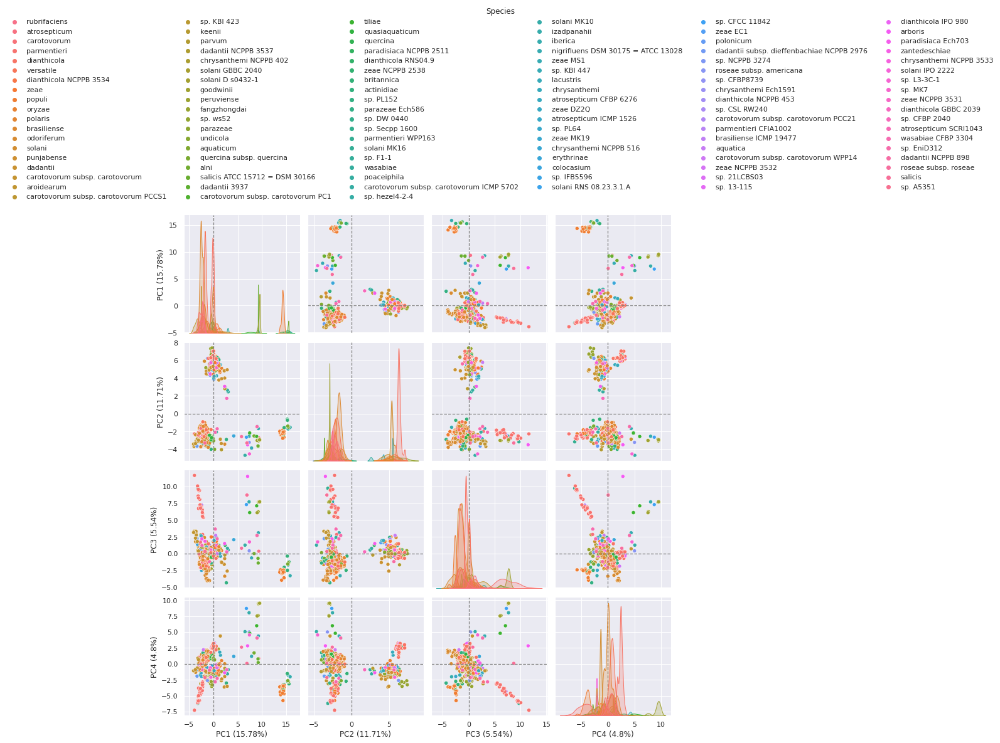

In [84]:
g = sns.pairplot(
    fam_freq_df_ggs_pc,
    vars=colnames,
    hue="Species",
    diag_kind="kde",
    height=3,
);

i = 0
for ax in g.axes.ravel():
    if ax is None:
        continue
    if i not in [0,5,10,15]:
        ax.axhline(0, linestyle='--', color='grey', linewidth=1.25);
        ax.axvline(0, linestyle='--', color='grey', linewidth=1.25);
    else:
        ax.axvline(0, linestyle='--', color='grey', linewidth=1.25);
    i += 1
    
sns.move_legend(g, "lower center", bbox_to_anchor=(.5, 1), ncol=6, title='Species', frameon=False);
    
plt.savefig(
    '../results/pca/pca_pc_screen_species.svg',
    bbox_inches='tight',
    format='svg'
)

There are so many species that it is difficult to tell the colours apart. Therefore, pick out some stories of interest, colour code these genomes and leave the rest grey.

In [85]:
# pick out some stories and colour code the species plot accordingly

PC1 separates out the genomes in a manner that correlates with their genus classification: _Pectobacterium_ genomes are locataed in the negative PC1 axis, and _Dickeya_ genomes are located in the positive PC1 axis.

PCs 2-4 do not correlate with the genus classification. In plots (from PC1-PC4) show the genome clustering correlating with species classification.

### Individual plots

Having made a pairwise plot. Generate a scatter and loadings plot for each pair of PCs from PC1-PC4. This will make it easier to look at the details in each plot, and will make it easier to tell species apart.

Additional pauses are placed into the code to allow time for the notebook to render to figure before generating the next. This does not impact the figures that are saved to disk, but if the pauses (`time.sleep()`) are excluded, data from one figure may appear in another.

### PC1 vs PC2

Built output directory: ../results/pca/PC1-vs-PC2


PC1 vs PC2 - plotting Genera
Not applying hue order
Applying style
Not applying style order


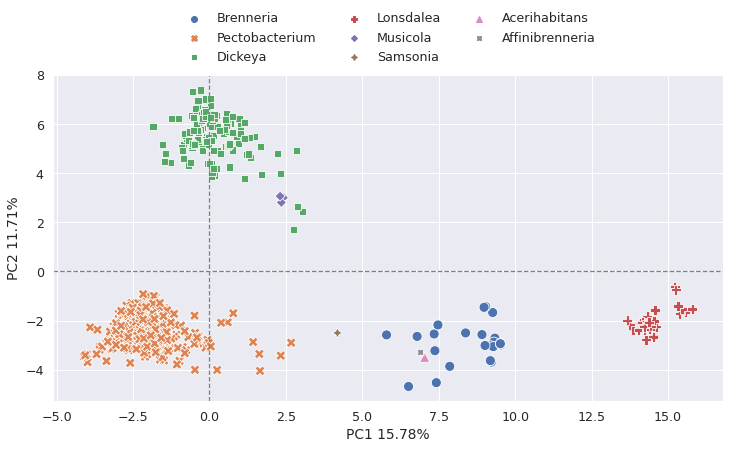

PC1 vs PC2 - plotting Species
Not applying hue order
Applying style
Not applying style order


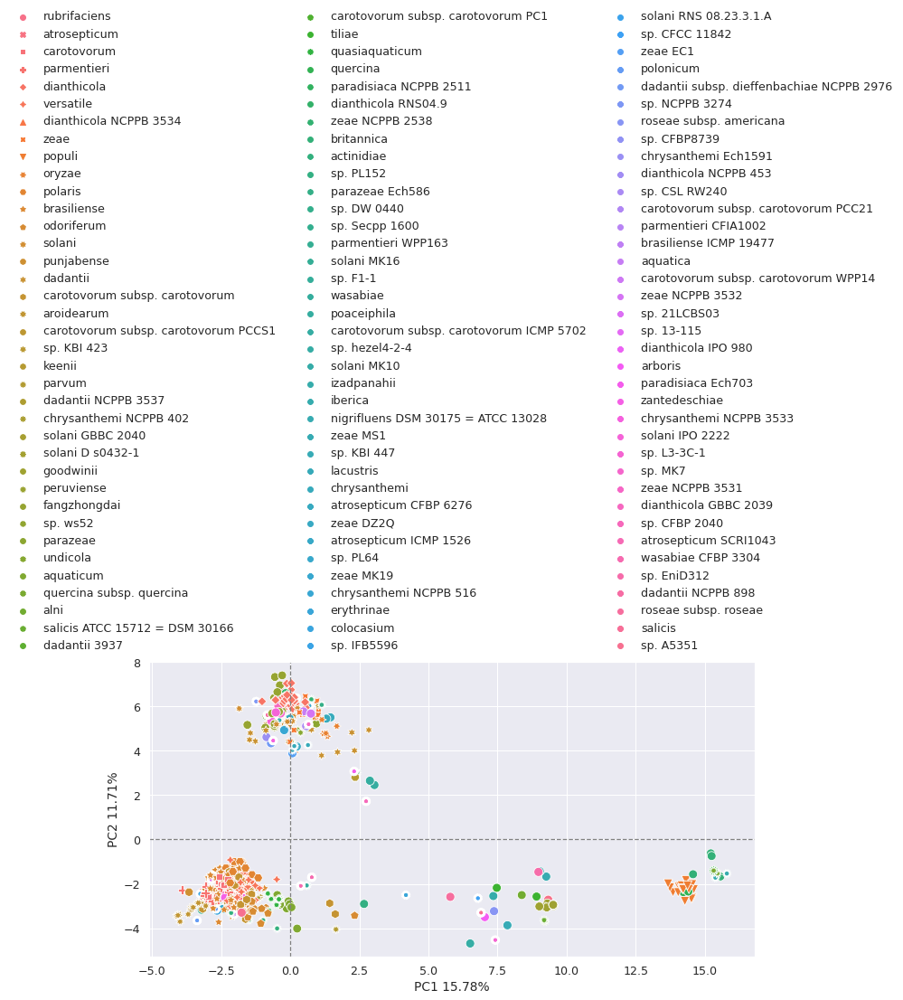

PC1 vs PC2 - Loadings plot


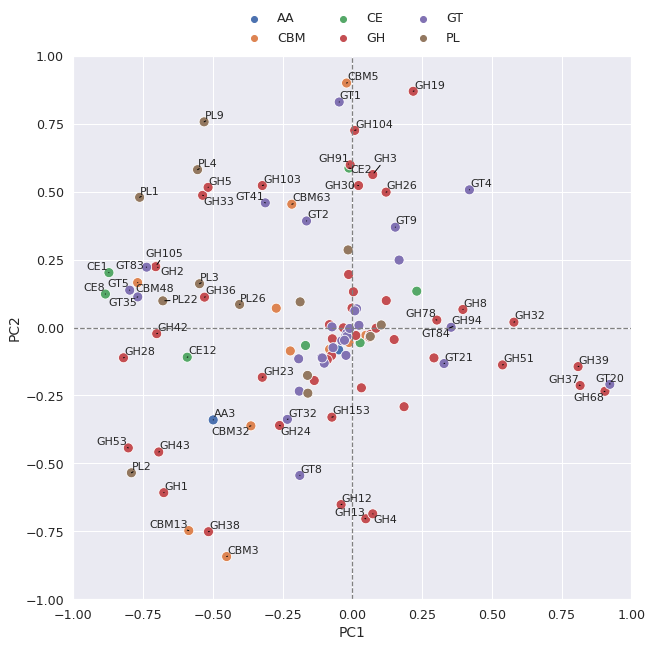

In [86]:
pc_pair = (1,2)
output_dir = Path(f'../results/pca/PC{pc_pair[0]}-vs-PC{pc_pair[1]}')
make_output_directory(output_dir, force=True, nodelete=True)

for job in ['genus', 'species', 'loadings']:
    if job == 'genus':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Genera")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-genus.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Genus',
            style='Genus',
            file_path=out,
        );
        time.sleep(2)

    elif job == 'species':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Species")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-species.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Species',
            style='Species',
            file_path=out,
        );
        time.sleep(2)

    elif job == 'loadings':  # loadings plot
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - Loadings plot")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-loadings_plot.png'
        g = plot_loadings(
            pectobact_pca,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            threshold=0.3,
            fig_size=(10,10),
            file_path=out,
            font_size=11,
        );

Regenerate the scatter plot of PC1 vs PC2, labelling the _Dickeya_ genomes that are clustered with _Musicola_, and the _Pectobacterium_ genomes that are on the PC1 +ve axis.

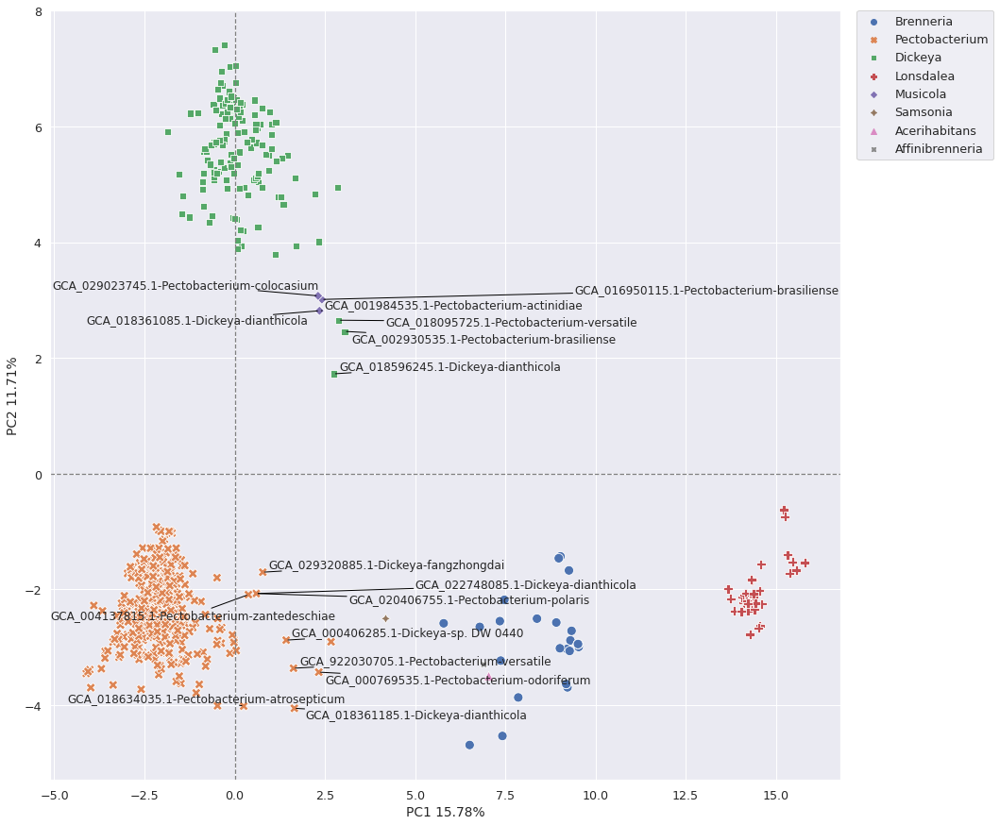

In [87]:
X_pca = pectobact_pca.transform(X_scaled)
plt.figure(figsize=(15,15))
sns.set(font_scale=1.15)
g = sns.scatterplot(
    x=X_pca[:,0],
    y=X_pca[:,1],
    data=fam_freq_filtered_df_ggs,
    hue='Genus',
    style='Genus',
    s=100,
    markers=True,
)

g.axhline(0, linestyle='--', color='grey', linewidth=1.25);
g.axvline(0, linestyle='--', color='grey', linewidth=1.25);

plt.ylabel(f"PC2 {100 * pectobact_pca.explained_variance_ratio_[1]:.2f}%");
plt.xlabel(f"PC1 {100 * pectobact_pca.explained_variance_ratio_[0]:.2f}%");
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

genome_lbls = ["-".join(_) for _ in fam_freq_df_ggs.index]
x_vals = X_pca[:,0]
y_vals = X_pca[:,1]

texts = [
    plt.text(
        xval,
        yval,
        lbl,
        ha='center',
        va='center',
        fontsize=12,
    ) for (xval, yval, lbl) in zip(
        x_vals, y_vals, genome_lbls
    ) if ((xval > 2) and (yval < 3.5) and (yval > 0) and (xval < 4)) or ((xval > 0.1) and (xval < 2.5) and (yval < 0))
]
adjustText.adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black'));

plt.savefig('../results/pca/pca_pc1_vs_pc2_musicola_annotated.png', bbox_inches='tight', format='png')

### PC1 vs PC3

Built output directory: ../results/pca/PC1-vs-PC3


PC1 vs PC3 - plotting Genera
Not applying hue order
Applying style
Not applying style order


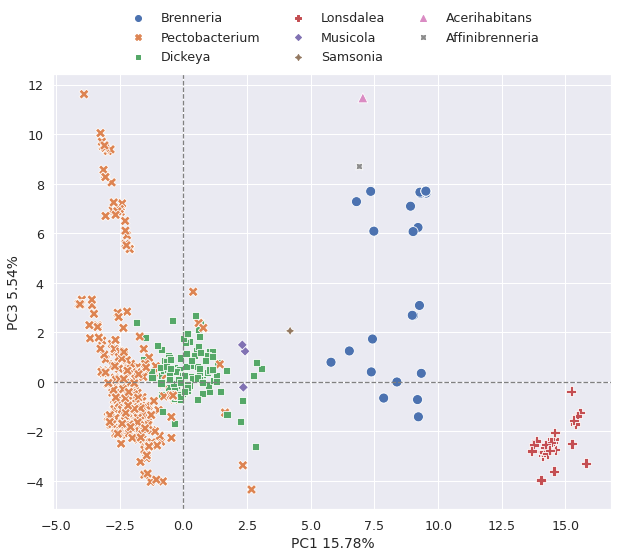

PC1 vs PC3 - plotting Species
Not applying hue order
Applying style
Not applying style order


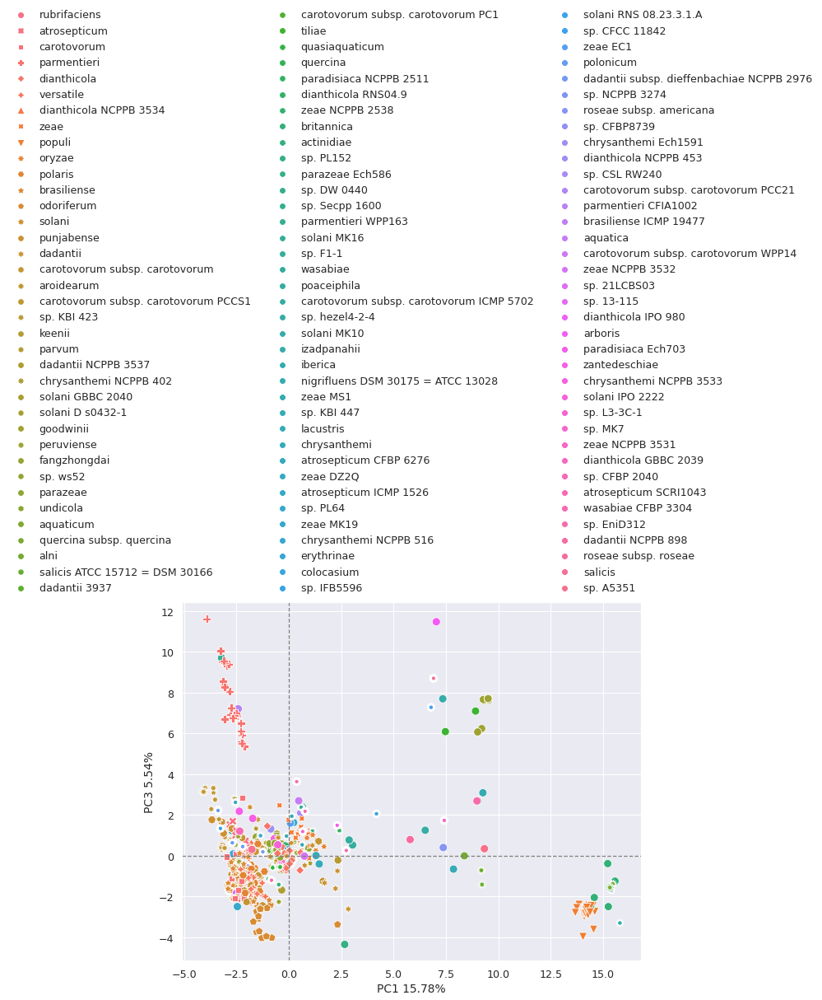

PC1 vs PC3 - Loadings plot


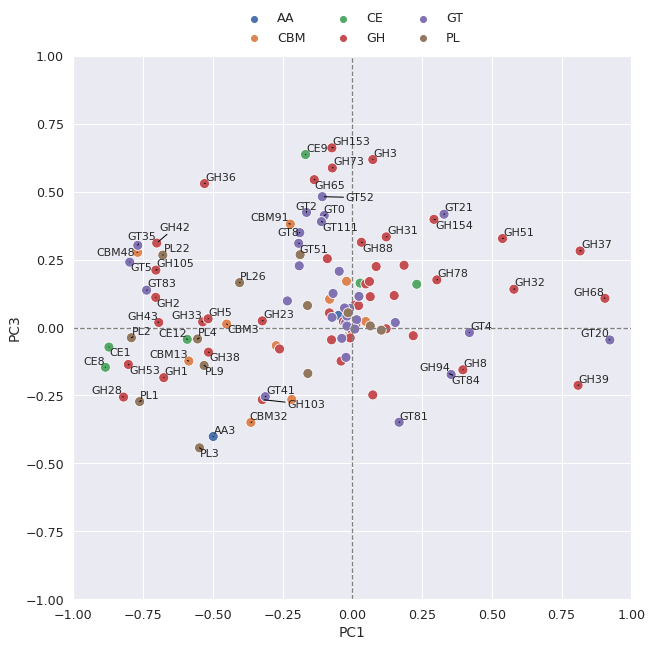

In [88]:
pc_pair = (1,3)
output_dir = Path(f'../results/pca/PC{pc_pair[0]}-vs-PC{pc_pair[1]}')
make_output_directory(output_dir, force=True, nodelete=True)

for job in ['genus', 'species', 'loadings']:
    if job == 'genus':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Genera")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-genus.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Genus',
            style='Genus',
            file_path=out,
            figsize=(10,8),
        );
        time.sleep(2)

    elif job == 'species':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Species")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-species.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Species',
            style='Species',
            file_path=out,
            figsize=(10,8),
        );
        time.sleep(2)

    elif job == 'loadings':  # loadings plot
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - Loadings plot")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-loadings_plot.png'
        g = plot_loadings(
            pectobact_pca,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            threshold=0.3,
            fig_size=(10,10),
            file_path=out,
            font_size=11,
        );

### PC1 vs PC4

Built output directory: ../results/pca/PC1-vs-PC4


PC1 vs PC4 - plotting Genera
Not applying hue order
Applying style
Not applying style order


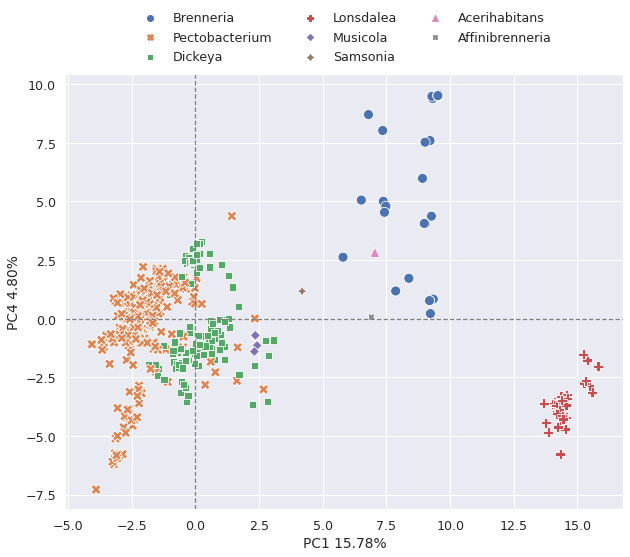

PC1 vs PC4 - plotting Species
Not applying hue order
Applying style
Not applying style order


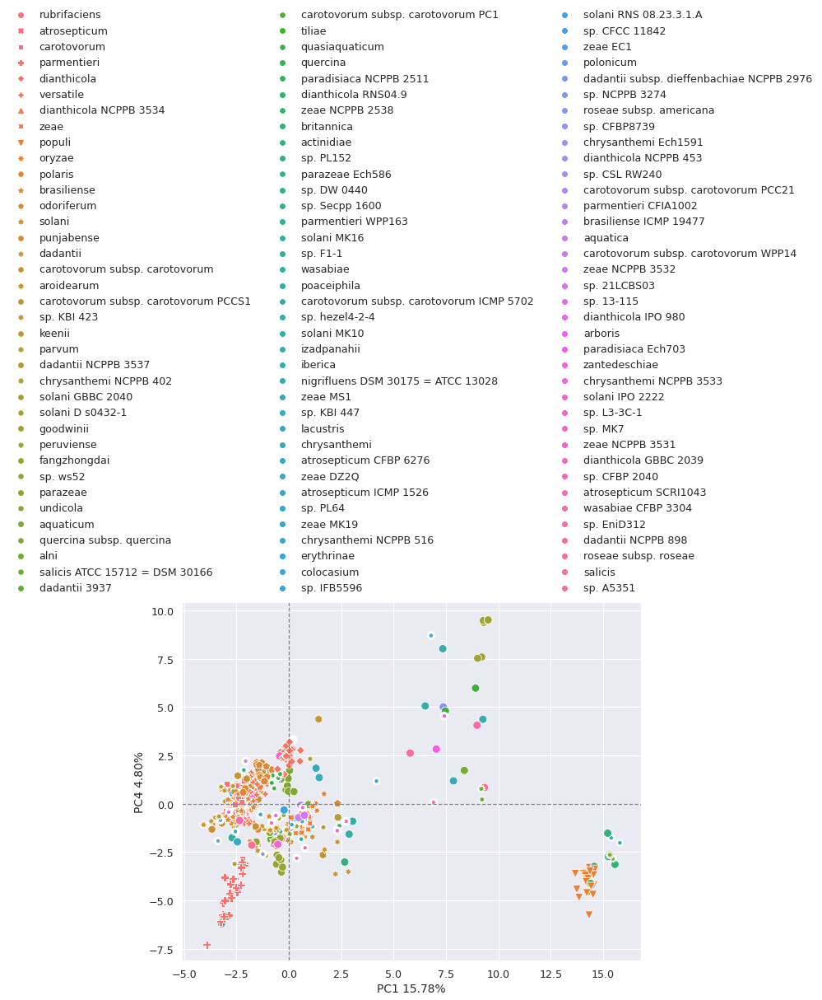

PC1 vs PC4 - Loadings plot


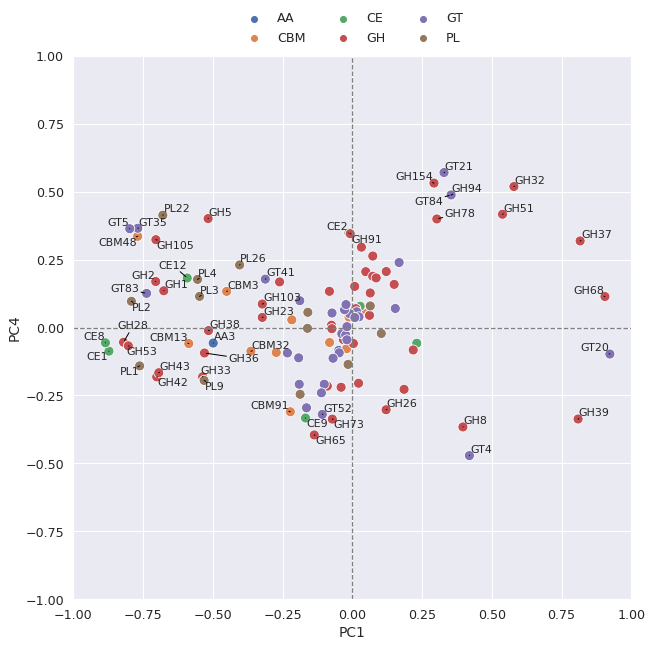

In [89]:
pc_pair = (1,4)
output_dir = Path(f'../results/pca/PC{pc_pair[0]}-vs-PC{pc_pair[1]}')
make_output_directory(output_dir, force=True, nodelete=True)

for job in ['genus', 'species', 'loadings']:
    if job == 'genus':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Genera")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-genus.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Genus',
            style='Genus',
            file_path=out,
            figsize=(10,8),
        );
        time.sleep(2)

    elif job == 'species':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Species")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-species.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Species',
            style='Species',
            file_path=out,
            figsize=(10,8),
        );
        time.sleep(2)

    elif job == 'loadings':  # loadings plot
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - Loadings plot")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-loadings_plot.png'
        g = plot_loadings(
            pectobact_pca,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            threshold=0.3,
            fig_size=(10,10),
            file_path=out,
            font_size=11,
        );

### PC2 vs PC3

Built output directory: ../results/pca/PC2-vs-PC3


PC2 vs PC3 - plotting Genera
Not applying hue order
Applying style
Not applying style order


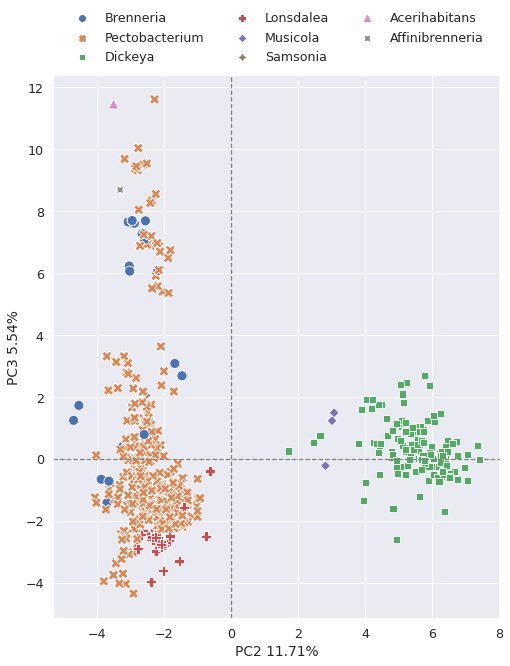

PC2 vs PC3 - plotting Species
Not applying hue order
Applying style
Not applying style order


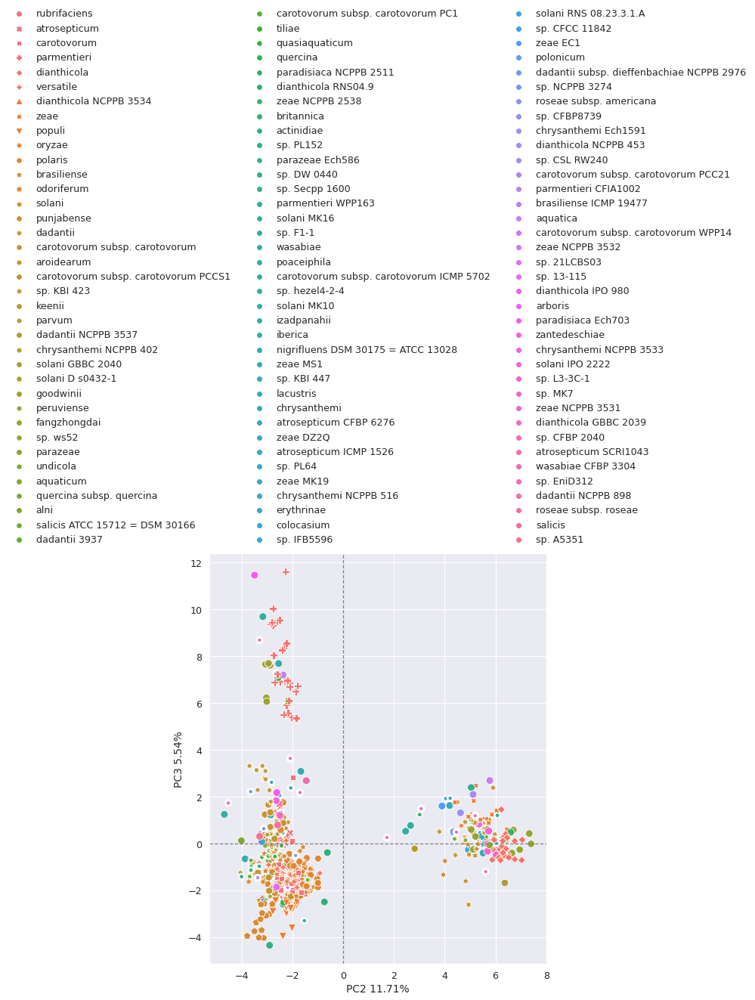

PC2 vs PC3 - Loadings plot


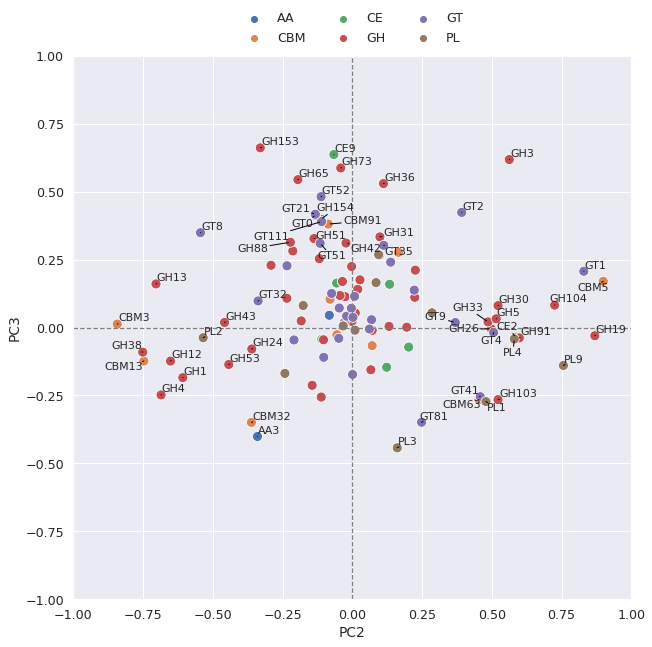

In [90]:
pc_pair = (2,3)
output_dir = Path(f'../results/pca/PC{pc_pair[0]}-vs-PC{pc_pair[1]}')
make_output_directory(output_dir, force=True, nodelete=True)

for job in ['genus', 'species', 'loadings']:
    if job == 'genus':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Genera")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-genus.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Genus',
            style='Genus',
            file_path=out,
            figsize=(8,10),
        );
        time.sleep(2)

    elif job == 'species':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Species")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-species.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Species',
            style='Species',
            file_path=out,
            figsize=(8,10),
        );
        time.sleep(2)

    elif job == 'loadings':  # loadings plot
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - Loadings plot")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-loadings_plot.png'
        g = plot_loadings(
            pectobact_pca,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            threshold=0.3,
            fig_size=(10,10),
            file_path=out,
            font_size=11,
        );

### PC2 vs PC4

Built output directory: ../results/pca/PC2-vs-PC4


PC2 vs PC4 - plotting Genera
Not applying hue order
Applying style
Not applying style order


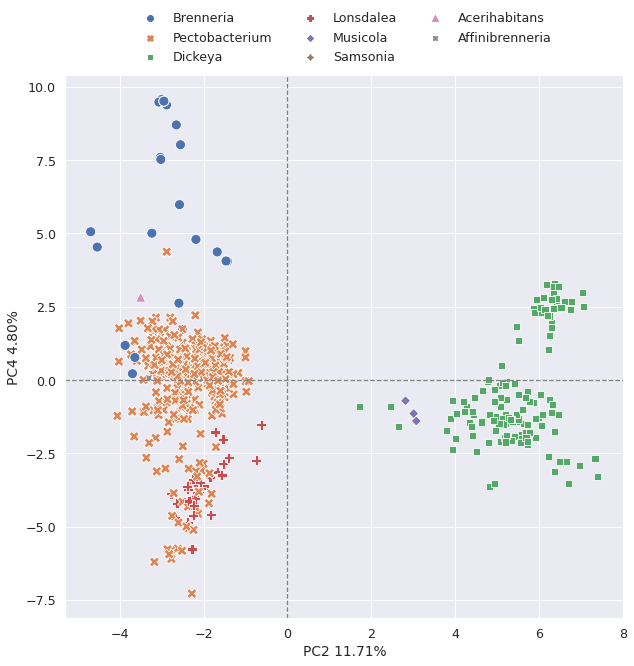

PC2 vs PC4 - plotting Species
Not applying hue order
Applying style
Not applying style order


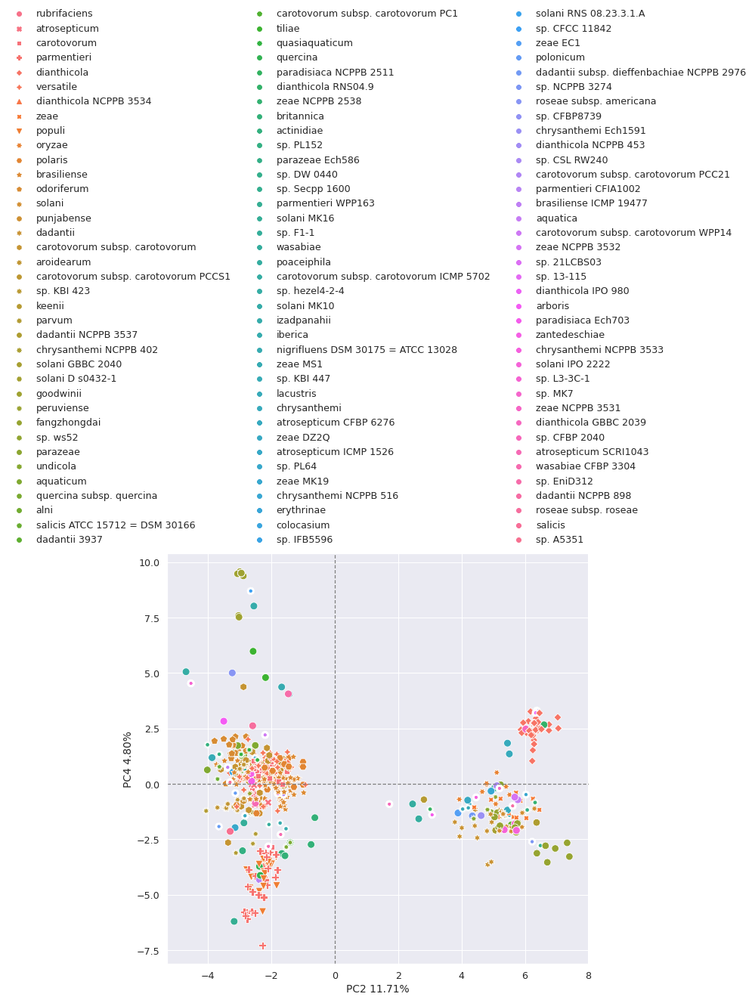

PC2 vs PC4 - Loadings plot


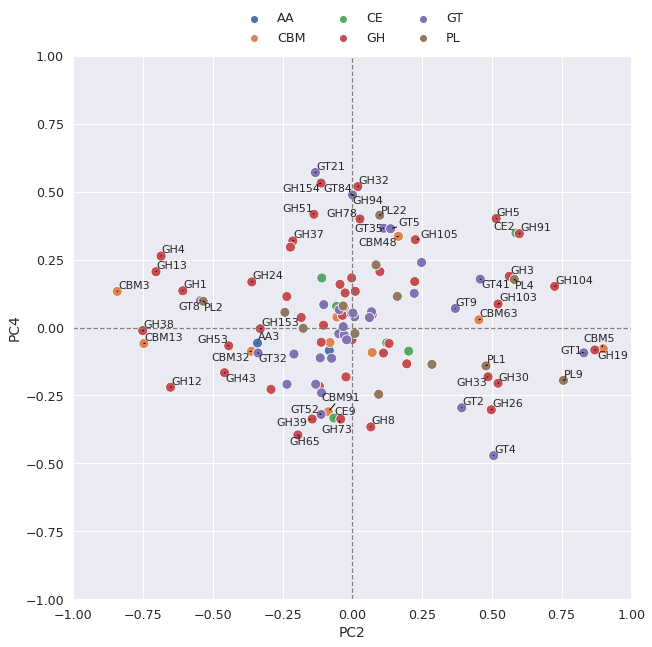

In [91]:
pc_pair = (2,4)
output_dir = Path(f'../results/pca/PC{pc_pair[0]}-vs-PC{pc_pair[1]}')
make_output_directory(output_dir, force=True, nodelete=True)

for job in ['genus', 'species', 'loadings']:
    if job == 'genus':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Genera")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-genus.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Genus',
            style='Genus',
            file_path=out,
            figsize=(10,10),
        );
        time.sleep(2)

    elif job == 'species':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Species")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-species.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Species',
            style='Species',
            file_path=out,
            figsize=(10,10),
        );
        time.sleep(2)

    elif job == 'loadings':  # loadings plot
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - Loadings plot")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-loadings_plot.png'
        g = plot_loadings(
            pectobact_pca,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            threshold=0.3,
            fig_size=(10,10),
            file_path=out,
            font_size=11,
        );

### PC3 vs PC4

Built output directory: ../results/pca/PC3-vs-PC4


PC3 vs PC4 - plotting Genera
Not applying hue order
Applying style
Not applying style order


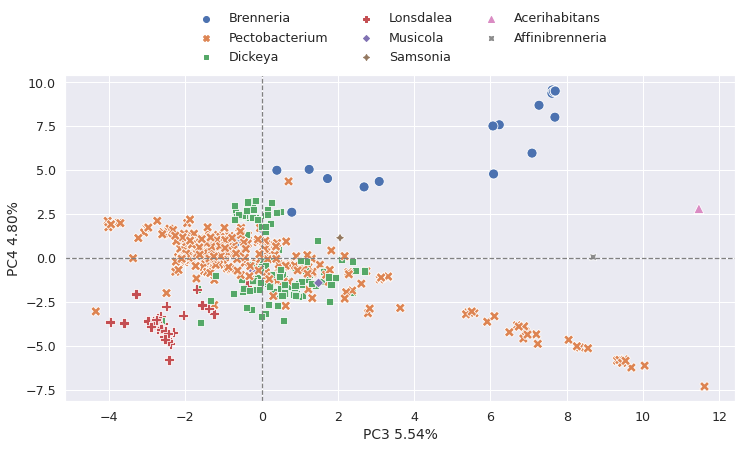

PC3 vs PC4 - plotting Species
Not applying hue order
Applying style
Not applying style order


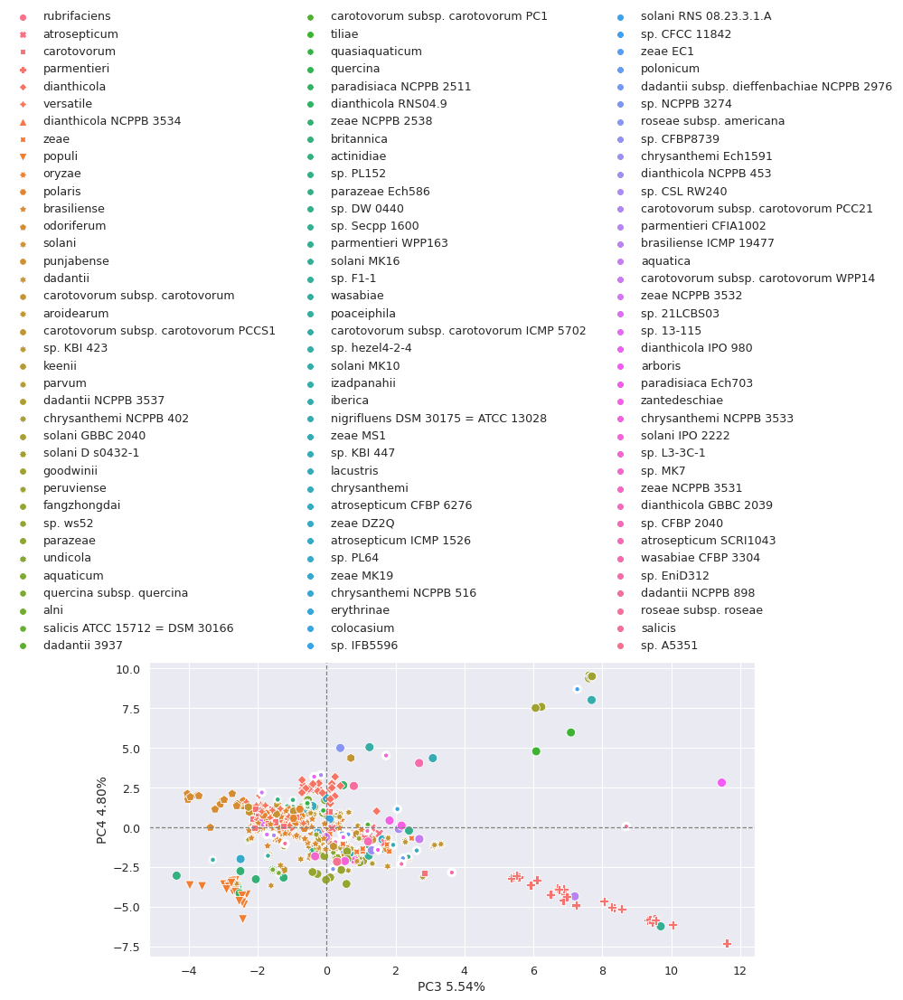

PC3 vs PC4 - Loadings plot


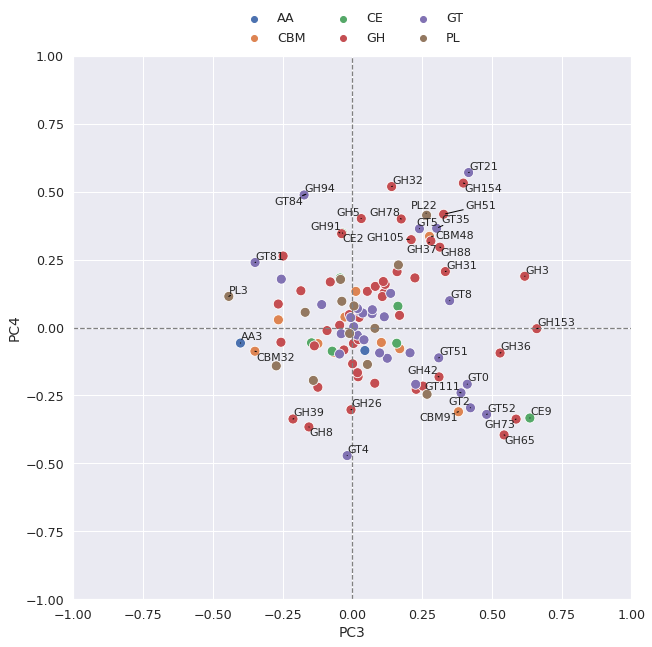

In [92]:
pc_pair = (3,4)
output_dir = Path(f'../results/pca/PC{pc_pair[0]}-vs-PC{pc_pair[1]}')
make_output_directory(output_dir, force=True, nodelete=True)

for job in ['genus', 'species', 'loadings']:
    if job == 'genus':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Genera")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-genus.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Genus',
            style='Genus',
            file_path=out,
        );
        time.sleep(2)

    elif job == 'species':
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - plotting Species")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-species.png'
        g = plot_pca(
            pectobact_pca,
            X_scaled,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            'Species',
            style='Species',
            file_path=out,
        );
        time.sleep(2)

    elif job == 'loadings':  # loadings plot
        print(f"PC{pc_pair[0]} vs PC{pc_pair[1]} - Loadings plot")
        out = output_dir/f'pca_pc{pc_pair[0]}_vs_pc{pc_pair[1]}-loadings_plot.png'
        g = plot_loadings(
            pectobact_pca,
            fam_freq_filtered_df_ggs,
            pc_pair[0],
            pc_pair[1],
            threshold=0.3,
            fig_size=(10,10),
            file_path=out,
            font_size=11,
        );

Generate the scatter plot of PC3 vs PC4 again with only _Pectobacterium_ genomes to identify the species that are diverging from the centre of the plot.

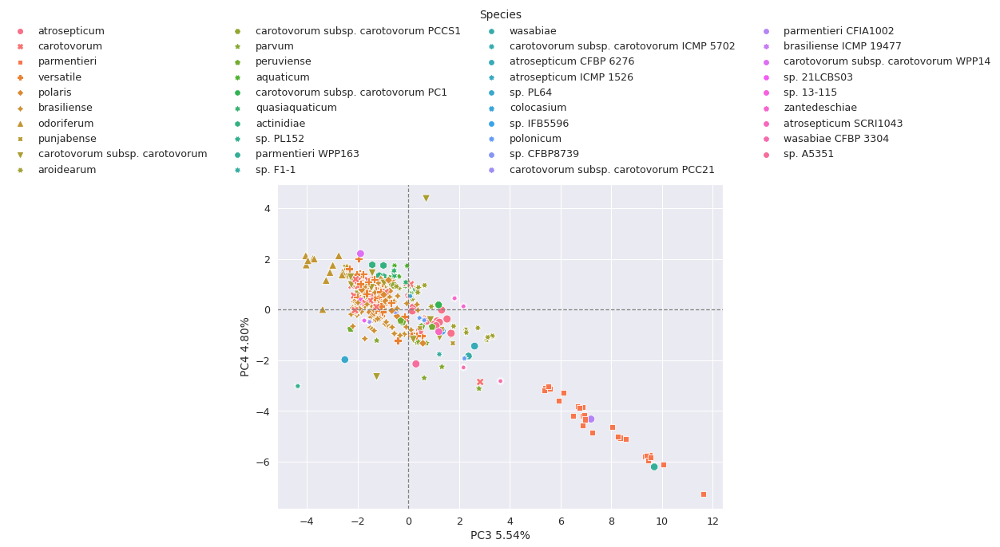

In [93]:
X_pca = pectobact_pca.transform(X_scaled)

plt.figure(figsize=(10,7.5))
sns.set(font_scale=1.15)

temp_d_fam_freq_df_ggs = fam_freq_filtered_df_ggs[fam_freq_filtered_df_ggs['Genus'] == 'Pectobacterium']

g = sns.scatterplot(
    x=X_pca[:,2][fam_freq_filtered_df_ggs['Genus'] == 'Pectobacterium'],
    y=X_pca[:,3][fam_freq_filtered_df_ggs['Genus'] == 'Pectobacterium'],
    data=temp_d_fam_freq_df_ggs,
    hue='Species',
    style='Species',
    s=100,
    markers=True,
)

g.axhline(0, linestyle='--', color='grey', linewidth=1.25);
g.axvline(0, linestyle='--', color='grey', linewidth=1.25);

plt.ylabel(f"PC4 {100 * pectobact_pca.explained_variance_ratio_[3]:.2f}%");
plt.xlabel(f"PC3 {100 * pectobact_pca.explained_variance_ratio_[2]:.2f}%");

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);
sns.move_legend(g, "lower center", bbox_to_anchor=(.5, 1), ncol=4, title='Species', frameon=False);

plt.savefig(
    '../results/pca/p_pc3_pc4_pectobacterium_sp.svg',
    bbox_inches='tight',
    format='svg',
)